# MCP-HaloTag testing: Bin Average Fit

## Data import

In [21]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from transcription_pipeline import preprocessing_pipeline
# Comments
RBSPWM_dataset1 = "test_data/2024-02-26/Halo-RBSPWM_embryo01"
RBSPWM_dataset2 = "test_data/2024-02-26/Halo-RBSPWM_embryo02"

RBSPWM_dataset3 = "test_data/2024-05-07/Halo552-RBSPWM_embryo01" # 1024x256, time res 4.2 seconds
RBSPWM_dataset4 = "test_data/2024-05-07/Halo552-RBSPWM_embryo02" # 800x300 

RBSPWM_dataset5 = "test_data/2024-05-09/Halo552-RBSPWM_embryo01" # 40x magnification

InputOutput_embryo1 = "test_data/InputOutput_MCPHaloTag/2024-03-07/embryo1"
InputOutput_embryo2 = "test_data/InputOutput_MCPHaloTag/2024-03-07/embryo2"

test_dataset_name = "/mnt/Data1/Josh/transcription_pipeline-main/test_data/2024-07-25/Halo673_RBSVar2_embryo01"

In [22]:
# ## Import from scratch
# dataset = preprocessing_pipeline.DataImport(
#     name_folder=test_dataset_name,
#     trim_series=True,
#     working_storage_mode='zarr',
#     # import_previous=True, 
# )
# dataset.save()

In [23]:
## Load from zarr
dataset = preprocessing_pipeline.DataImport(
    name_folder=test_dataset_name,
    trim_series=True,
    # working_storage_mode='zarr',
    import_previous=True, 
)

### Starting a Dask Client for parallelization

In [24]:
from dask.distributed import LocalCluster, Client
## Scheme 1 (Fit & Average): Fitting to Individual MS2 Traces and then Take Their Average for Each Bin
try:
    cluster = LocalCluster(
        host="localhost",
        scheduler_port=37763,
        threads_per_worker=1,
        n_workers=14,
        memory_limit="6GB",
    )
    
    client = Client(cluster)
except:
    print("Cluster already running")
    client = Client('localhost:37763')

print(client)

/mnt/Data1/Josh/miniforge3/envs/transcription_pipeline/lib/python3.10/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 33997 instead
  warnings.warn(
2024-09-11 15:20:37,340 - distributed.deploy.spec - WARNING - Cluster closed without starting up


Cluster already running
<Client: 'tcp://127.0.0.1:37763' processes=14 threads=14, memory=78.23 GiB>


In [25]:
client.restart()

<Client: 'tcp://127.0.0.1:37763' processes=14 threads=14, memory=78.23 GiB>

In [26]:
client

<Client: 'tcp://127.0.0.1:37763' processes=14 threads=14, memory=78.23 GiB>

## Spot analysis

In [27]:
from transcription_pipeline import spot_pipeline

In [28]:
# %%time

# spot_tracking = spot_pipeline.Spot(
#     data=dataset.channels_full_dataset[0],
#     global_metadata=dataset.export_global_metadata[0],
#     frame_metadata=dataset.export_frame_metadata[0],
#     labels=None, #nuclear_tracking.reordered_nuclear_labels,
#     expand_distance=3,
#     retrack_search_range_um=3, # original value was 4.5 and had an issue of assigning two spots to a particle in a single frame
#     series_splits=dataset.series_splits,
#     series_shifts=dataset.series_shifts,
#     keep_bandpass=False,
#     keep_futures=False,
#     keep_spot_labels=False,
#     evaluate=True,
#     retrack_by_intensity=False,
#     client=client,
    
#     # Parameters to be tuned
#     threshold_factor=1.7,
#     search_range_um=1.5, # original value was 2.5
#     memory=3,
#     min_track_length=5,
#     retrack_after_filter=False
# )

# spot_tracking.extract_spot_traces(working_memory_folder=test_dataset_name, trackpy_log_path = test_dataset_name+'/trackpy_log')
# # Saves tracked spot mask as a zarr, and pickles dataframes with spot fitting and
# # quantification information.
# spot_tracking.save_results(name_folder=test_dataset_name, save_array_as=None)

In [29]:
# The following dataset is marked as far posterior in the lab notebook

In [30]:
track_spots = spot_pipeline.Spot()

track_spots.read_results(name_folder=test_dataset_name)

In [31]:
spot_df = track_spots.spot_dataframe

In [32]:
detected_spots = spot_df[spot_df["particle"] != 0]

In [33]:
detected_spots['raw_spot'].head()

10    [[[0, 1, 4, 0, 2, 0, 1, 1, 1], [1, 0, 0, 0, 1,...
11    [[[1, 2, 0, 0, 2, 3, 2, 2, 1], [0, 0, 0, 0, 1,...
13    [[[0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1,...
14    [[[4, 0, 2, 2, 1, 1, 3, 0, 0], [2, 0, 2, 1, 2,...
17    [[[3, 0, 0, 0, 1, 1, 3, 1, 0], [1, 1, 0, 0, 2,...
Name: raw_spot, dtype: object

## Compiling Data

In [34]:
from transcription_pipeline.spot_analysis import compile_data

In [35]:
compiled_dataframe = compile_data.compile_traces(
    detected_spots,
    compile_columns_spot=[
        "frame",
        "t_s",
        "intensity_from_neighborhood",
        "intensity_std_error_from_neighborhood",
        "x",
        "y"
    ],
    nuclear_tracking_dataframe=None,
)

In [36]:
compiled_dataframe

,particle,frame,t_s,intensity_from_neighborhood,intensity_std_error_from_neighborhood,x,y
0,1,"[506, 507, 511, 512, 513, 514, 515, 517, 518, ...","[2300.7059993743896, 2304.7430000305176, 2322....","[72.1570804597701, 53.93129347826087, 95.00423...","[25.268212723555116, 24.193128325434877, 23.27...","[425.48808831836254, 423.8314928296911, 425.13...","[221.00383393743027, 221.58308686421765, 221.5..."
1,2,"[460, 461, 462, 463, 464, 465, 466, 467, 468, ...","[2091.4230003356934, 2095.882999420166, 2100.1...","[57.47963945578232, 38.66103448275862, 90.2138...","[27.24615631798166, 25.318037332850935, 24.569...","[122.58614821001362, 123.76488548423376, 126.0...","[17.180038487563998, 17.208933264743397, 18.12..."
2,3,"[527, 528, 529, 530, 531, 532, 533, 534, 535, ...","[2394.573999404907, 2399.2339992523193, 2403.4...","[67.31827607361961, 10.19521568627451, 67.1475...","[26.219966228377146, 26.957198706766793, 25.65...","[588.016012440591, 586.074051884851, 588.18053...","[48.20524698088067, 48.37057827336589, 48.2503..."
3,4,"[572, 573, 574, 576, 577, 578, 580, 581, 582, ...","[2601.6180000305176, 2605.8780002593994, 2610....","[131.19976923076925, 114.73455625, 112.1208231...","[23.632369088123415, 26.48124363284603, 24.361...","[247.29672998614768, 245.9633552657412, 245.16...","[119.09766185700249, 119.2585299587735, 118.06..."
4,5,"[486, 489, 490, 491, 492, 493, 494, 495, 496, ...","[2211.6900005340576, 2225.287000656128, 2229.7...","[49.39227659574468, 71.93047777777778, 75.6659...","[23.603968369418688, 23.202337971412053, 23.80...","[473.56080767748307, 471.83975365873124, 471.4...","[127.7748944142374, 128.7753637411546, 128.167..."
...,...,...,...,...,...,...,...
468,1635,"[13, 14, 15, 16, 17, 18]","[75.25100135803223, 79.71100044250488, 84.1710...","[57.917, 96.37611428571428, 41.49257222222222,...","[29.764216168496695, 31.99076069454289, 29.155...","[966.7360493785635, 966.9670023718876, 967.012...","[22.358608583649378, 22.347873269063435, 21.81..."
469,1641,"[3, 4, 6, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]","[10.393999099731445, 14.222999572753906, 23.56...","[70.5425172413793, 18.665125, 116.666522988505...","[27.20795850842535, 29.853332197863384, 32.057...","[426.36292041255393, 427.9107856280469, 427.34...","[12.635025934179449, 12.066787392054756, 14.61..."
470,1649,"[1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 16]","[0.8339996337890625, 9.769998550415039, 14.222...","[70.67361271676302, 48.60410526315789, 108.282...","[28.07864299572493, 34.4618497019257, 29.45114...","[106.57669082607538, 106.1072214418041, 105.11...","[103.0903281627006, 101.40827302065728, 100.48..."
471,1692,"[1, 2, 4, 5, 6, 8]","[0.625, 5.083000183105469, 14.013999938964844,...","[152.44397647058824, 149.27806875000002, 182.8...","[33.528912923752564, 33.593776442965755, 33.08...","[189.04303924016656, 188.8988384179611, 188.62...","[167.625066655575, 166.40622069357494, 166.392..."


## Visualizing traces

In [37]:
from transcription_pipeline.utils import plottable

In [38]:
# Restriction on trace length
min_frames = 80
traces_compiled_dataframe = compiled_dataframe[
    compiled_dataframe["frame"].apply(lambda x: x.size) > min_frames
]

# max_frames = 10
# traces_compiled_dataframe = traces_compiled_dataframe[
#     traces_compiled_dataframe["frame"].apply(lambda x: x.size) <= max_frames
# ]

In [39]:
plt.close()

#### Spot intensity vs. time

/mnt/Data1/Josh/transcription_pipeline/transcription_pipeline/utils/plottable.py:17: UserWarning: Could not determine division time, using absolute time.
  warnings.warn("Could not determine division time, using absolute time.")


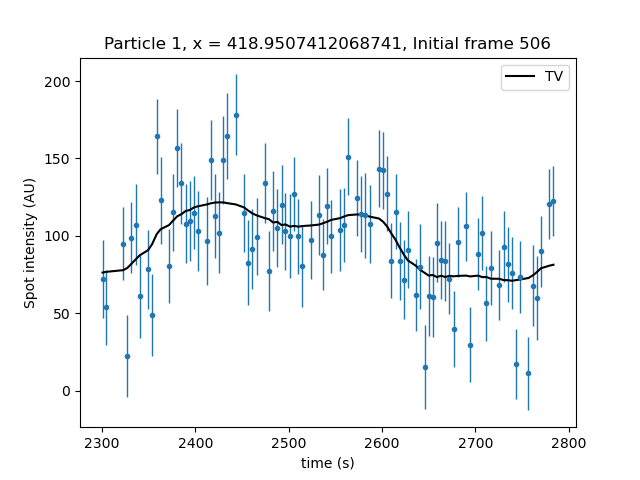

In [40]:
%matplotlib widget
# This is taken from https://stackoverflow.com/questions/18390461/scroll-backwards-and-forwards-through-matplotlib-plots
import matplotlib.pyplot as plt

from scipy.signal import medfilt
from skimage.restoration import denoise_tv_chambolle


traces = plottable.generate_trace_plot_list(traces_compiled_dataframe)
# median_filtered_traces = [medfilt(trace[1], kernel_size=9) for trace in traces]

tv_denoised_traces = [
    denoise_tv_chambolle(trace[1], weight=180, max_num_iter=500) for trace in traces
]
# potts_steps_traces = [
#     potts_l1.l1_potts_step_detection(trace[1], gamma=-5e3, weights=(1 / trace[2] ** 2))
#     for trace in traces
# ]

curr_pos = 0


def key_event(e):
    global curr_pos

    if e.key == "right":
        curr_pos = curr_pos + 1
    elif e.key == "left":
        curr_pos = curr_pos - 1
    else:
        return
    curr_pos = curr_pos % len(traces)

    ax.cla()
    ax.errorbar(
        traces[curr_pos][0],
        traces[curr_pos][1],
        yerr=traces[curr_pos][2],
        fmt=".",
        elinewidth=1,
    )
    # ax.plot(traces[curr_pos][0], median_filtered_traces[curr_pos], color="k")
    ax.plot(traces[curr_pos][0], tv_denoised_traces[curr_pos], color="k", label="TV")
    # ax.step(
    #     traces[curr_pos][0],
    #     potts_steps_traces[curr_pos],
    #     where="mid",
    #     color="red",
    #     label="Potts L1",
    # )
    ax.set_xlabel("time (s)")
    ax.set_ylabel("Spot intensity (AU)")

    particle = traces[curr_pos][3]
    mean_x = (
        compiled_dataframe.loc[compiled_dataframe["particle"] == particle, "x"]
        .values[0]
        .mean()
    )
    initial_frame = (
    compiled_dataframe.loc[compiled_dataframe["particle"] == particle, "frame"]
    .values[0][0]
    )
    ax.set_title(f"Particle {particle}, x = {mean_x}, Initial frame {initial_frame}")
    ax.legend()
    fig.canvas.draw()


fig = plt.figure()
fig.canvas.mpl_connect("key_press_event", key_event)

ax = fig.add_subplot(111)
ax.errorbar(
    traces[curr_pos][0],
    traces[curr_pos][1],
    yerr=traces[curr_pos][2],
    fmt=".",
    elinewidth=1,
)
# ax.plot(traces[curr_pos][0], median_filtered_traces[curr_pos], color="k")
ax.plot(traces[curr_pos][0], tv_denoised_traces[curr_pos], color="k", label="TV")
# ax.step(
#     traces[curr_pos][0],
#     potts_steps_traces[curr_pos],
#     where="mid",
#     color="red",
#     label="Potts L1",
# )
ax.set_xlabel("time (s)")
ax.set_ylabel("Spot intensity (AU)")

particle = traces[curr_pos][3]
mean_x = (
    compiled_dataframe.loc[compiled_dataframe["particle"] == particle, "x"]
    .values[0]
    .mean()
)
initial_frame = (
    compiled_dataframe.loc[compiled_dataframe["particle"] == particle, "frame"]
    .values[0][0]
)
ax.set_title(f"Particle {particle}, x = {mean_x}, Initial frame {initial_frame}")
ax.legend()

plt.show()

#### The same plot above but with frame in x axis

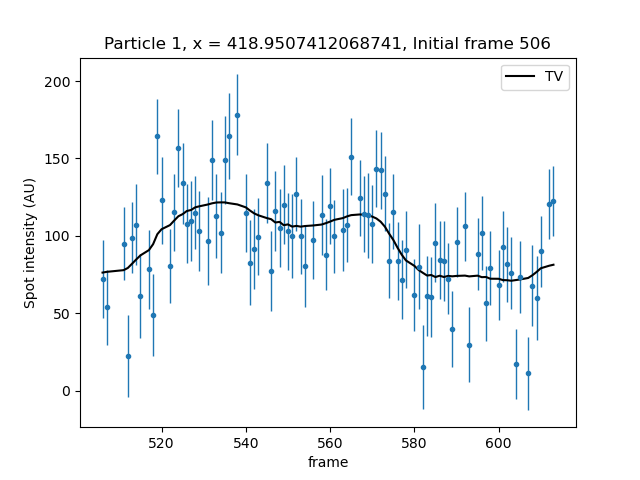

In [41]:
%matplotlib widget
# This is taken from https://stackoverflow.com/questions/18390461/scroll-backwards-and-forwards-through-matplotlib-plots
import matplotlib.pyplot as plt

from scipy.signal import medfilt
from skimage.restoration import denoise_tv_chambolle


traces = plottable.generate_trace_plot_list(traces_compiled_dataframe)
# median_filtered_traces = [medfilt(trace[1], kernel_size=9) for trace in traces]

tv_denoised_traces = [
    denoise_tv_chambolle(trace[1], weight=180, max_num_iter=500) for trace in traces
]
# potts_steps_traces = [
#     potts_l1.l1_potts_step_detection(trace[1], gamma=-5e3, weights=(1 / trace[2] ** 2))
#     for trace in traces
# ]

curr_pos = 0


def key_event(e):
    global curr_pos

    if e.key == "right":
        curr_pos = curr_pos + 1
    elif e.key == "left":
        curr_pos = curr_pos - 1
    else:
        return
    curr_pos = curr_pos % len(traces)

    ax.cla()
    ax.errorbar(
        np.array(traces_compiled_dataframe["frame"])[curr_pos],
        traces[curr_pos][1],
        yerr=traces[curr_pos][2],
        fmt=".",
        elinewidth=1,
    )
    # ax.plot(traces[curr_pos][0], median_filtered_traces[curr_pos], color="k")
    ax.plot(np.array(traces_compiled_dataframe["frame"])[curr_pos], tv_denoised_traces[curr_pos], color="k", label="TV")
    # ax.step(
    #     traces[curr_pos][0],
    #     potts_steps_traces[curr_pos],
    #     where="mid",
    #     color="red",
    #     label="Potts L1",
    # )
    ax.set_xlabel("frame")
    ax.set_ylabel("Spot intensity (AU)")

    particle = traces[curr_pos][3]
    mean_x = (
        compiled_dataframe.loc[compiled_dataframe["particle"] == particle, "x"]
        .values[0]
        .mean()
    )
    initial_frame = (
    compiled_dataframe.loc[compiled_dataframe["particle"] == particle, "frame"]
    .values[0][0]
    )
    ax.set_title(f"Particle {particle}, x = {mean_x}, Initial frame {initial_frame}")
    ax.legend()
    fig.canvas.draw()


fig = plt.figure()
fig.canvas.mpl_connect("key_press_event", key_event)

ax = fig.add_subplot(111)
ax.errorbar(
    np.array(traces_compiled_dataframe["frame"])[curr_pos],
    traces[curr_pos][1],
    yerr=traces[curr_pos][2],
    fmt=".",
    elinewidth=1,
)
# ax.plot(traces[curr_pos][0], median_filtered_traces[curr_pos], color="k")
ax.plot(np.array(traces_compiled_dataframe["frame"])[curr_pos], tv_denoised_traces[curr_pos], color="k", label="TV")
# ax.step(
#     traces[curr_pos][0],
#     potts_steps_traces[curr_pos],
#     where="mid",
#     color="red",
#     label="Potts L1",
# )
ax.set_xlabel("frame")
ax.set_ylabel("Spot intensity (AU)")

particle = traces[curr_pos][3]
mean_x = (
    compiled_dataframe.loc[compiled_dataframe["particle"] == particle, "x"]
    .values[0]
    .mean()
)
initial_frame = (
    compiled_dataframe.loc[compiled_dataframe["particle"] == particle, "frame"]
    .values[0][0]
)
ax.set_title(f"Particle {particle}, x = {mean_x}, Initial frame {initial_frame}")
ax.legend()
traces_compiled_dataframe
plt.show()

## Binning & Average of Data Points (without shifting)

In [42]:
def bin_average_NC14(compiled_dataframe, NC14_start_frame, shift_to_same_start_frame=False):
    # insert a column indicating the average position of the particle

    particle_num = compiled_dataframe.shape[0]
    
    # create a list of mean x position
    mean_x = []
    for i in range(particle_num):
        mean = np.mean(compiled_dataframe["x"][i])
        mean_x.append(mean)
    
    # create a list of particle start frames
    start_frame = []
    for i in range(particle_num):
        start = np.min(compiled_dataframe["frame"][i])
        start_frame.append(start)
    
    # append the mean x position to a temporary data frame
    compiled_dataframe_temp = compiled_dataframe[:]
    
    compiled_dataframe_temp.insert(compiled_dataframe_temp.shape[1], "mean_x", mean_x)
    compiled_dataframe_temp.insert(compiled_dataframe_temp.shape[1], "bin", [None]*particle_num)
    compiled_dataframe_temp.insert(compiled_dataframe_temp.shape[1], "start_frame", start_frame)

    # Assign a bin number to each particle

    x_dim = 1024 # x dimension of the image
    bin_num = 16 # number of bins
    
    bin_part = np.linspace(0, x_dim, bin_num+1) # partition bins
    
    # assign each particle to a bin
    for i in range(particle_num): # for each particle
        mean_x = compiled_dataframe_temp["mean_x"][i]
        
        for bin in range(bin_num): # for each bin
            if mean_x >= bin_part[bin] and mean_x < bin_part[bin+1]:
                compiled_dataframe_temp["bin"][i] = bin
            else:
                continue

    
    # sort particles by bins
    
    binned_particles = [None]*bin_num
    
    for bin in range(bin_num): # for each bin
        mask = compiled_dataframe_temp["bin"] == bin
        binned_particles[bin] = compiled_dataframe_temp[mask]

    
    # Keep only NC14 particles

    binned_particles_NC14 = [None for _ in range(bin_num)]
    for bin in range(bin_num):
        try:
            data = binned_particles[bin][:]
            filtered_data = data[data['start_frame'] >= NC14_start_frame]
            binned_particles_NC14[bin] = filtered_data
        except:
            continue
    
    
    # Shift all NC14 particles to the same start frame
    if shift_to_same_start_frame == True:
        binned_particles_NC14_shifted = binned_particles_NC14[:]
        for bin in range(bin_num):
            try:
                bin_particle_num = binned_particles_NC14_shifted[bin].index.max()+1
                for particle in range(bin_particle_num):
                    try:
                        frame_array = binned_particles_NC14_shifted[bin]['frame'][particle][:]
                        first_frame = frame_array[0]
                        new_frame_array = frame_array - first_frame
                        binned_particles_NC14_shifted[bin]['frame'][particle] = new_frame_array
                    except:
                        continue
            except:
                continue

    # a function that sorts intensity data based on bin and frame, and for each bin, calculates the average intensity in each frame

    def bin_average_process(binned_particles):
    
        # sort intensity data based on bin and frame
        
        intensity_by_frame = [[] for _ in range(bin_num)]
        
        for bin in range(bin_num):
                
            # find the max and min frame number in a bin
            try:
                max_frame = max(binned_particles[bin]["frame"].apply(np.max))
                min_frame = min(binned_particles[bin]["frame"].apply(np.min))
                
                intensity_by_frame[bin] = pd.DataFrame({'frame': range(min_frame,max_frame), 
                                     'intensity': [[] for _ in range(0,max_frame-min_frame)], 
                                     'average_intensity': [None for _ in range(0,max_frame-min_frame)],
                                    'std_err_intensity': [None for _ in range(0,max_frame-min_frame)]})
                
                bin_particle_num = binned_particles[bin].shape[0]
                
                for frame in range(min_frame, max_frame): # for each frame along the movie
                    FrameIndex = frame - min_frame
                    
                    for particle in range(bin_particle_num): # for each particle in the bin
                        particle_frames = np.array(binned_particles[bin])[particle][1] # extract the frame list of a single particle
                        particle_intensity = np.array(binned_particles[bin])[particle][3] # extract the intensity list of a single particle
    
                        # avoid 0 dimension array that will create undesired results
                        if particle_frames.ndim == 0:
                            particle_frames = np.array([particle_frames])
    
                        if particle_intensity.ndim == 0:
                            particle_intensity = np.array([particle_intensity])
                        
                        for el in range(len(particle_frames)): # for each frame of this particle
                            if particle_frames[el] == frame:
                                # add the intensity value of this particle at this frame to the new data structure
                                intensity_by_frame[bin]['intensity'][FrameIndex].append(particle_intensity[el])
            except:
                continue
    
        
        # for each bin, calculate the average intensity in each frame along with the standard error
        
        for bin in range(bin_num):
            try:
                frame_num = intensity_by_frame[bin].shape[0]
                for frame in range(frame_num):
                    intensity_data = intensity_by_frame[bin]['intensity'][frame]
                    intensity_by_frame[bin]['average_intensity'][frame] = np.mean(intensity_data)
                    intensity_by_frame[bin]['std_err_intensity'][frame] = np.std(intensity_data)/np.sqrt(len(intensity_data))
            except:
                continue
    
        return intensity_by_frame

    if shift_to_same_start_frame == True:
        return bin_average_process(binned_particles_NC14_shifted)
    else:
        return bin_average_process(binned_particles_NC14)

In [43]:
intensity_by_frame = bin_average_NC14(compiled_dataframe, shift_to_same_start_frame=False, NC14_start_frame=400)

/tmp/ipykernel_2649812/2276524800.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  compiled_dataframe_temp["bin"][i] = bin
/tmp/ipykernel_2649812/2276524800.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  compiled_dataframe_temp["bin"][i] = bin
/tmp/ipykernel_2649812/2276524800.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  compiled_dataframe_temp["bin"][i] = bin
/tmp/ipykernel_2649812/2276524800.py:38: SettingWithCopyWa

In [44]:
intensity_by_frame[14]

,frame,intensity,average_intensity,std_err_intensity
0,523,[21.522748387096772],21.522748,0.0
1,524,[],NaN,NaN
2,525,[],NaN,NaN
3,526,[],NaN,NaN
4,527,[],NaN,NaN
5,528,[62.66023863636363],62.660239,0.0
6,529,[],NaN,NaN
7,530,[77.21963583815028],77.219636,0.0
8,531,[],NaN,NaN
9,532,[],NaN,NaN


## Binning & Average of Data Points (with shifting)

In [45]:
intensity_by_frame_shifted = bin_average_NC14(compiled_dataframe, shift_to_same_start_frame=True, NC14_start_frame=400)

/tmp/ipykernel_2649812/2276524800.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  compiled_dataframe_temp["bin"][i] = bin
/tmp/ipykernel_2649812/2276524800.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  compiled_dataframe_temp["bin"][i] = bin
/tmp/ipykernel_2649812/2276524800.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  compiled_dataframe_temp["bin"][i] = bin
/tmp/ipykernel_2649812/2276524800.py:38: SettingWithCopyWa

In [46]:
intensity_by_frame_shifted[11]

,frame,intensity,average_intensity,std_err_intensity
0,0,"[65.53119354838711, 41.492344086021504]",53.511769,8.499017
1,1,[66.11220930232558],66.112209,0.0
2,2,[],NaN,NaN
3,3,[],NaN,NaN
4,4,[54.527606666666664],54.527607,0.0
5,5,[60.81929530201342],60.819295,0.0
6,6,[65.01571232876712],65.015712,0.0
7,7,[28.42088607594937],28.420886,0.0
8,8,[],NaN,NaN
9,9,[54.95031428571428],54.950314,0.0


### Old binning & average cells

In [274]:
# insert a column indicating the average position of the particle

particle_num = compiled_dataframe.shape[0]

# create a list of mean x position
mean_x = []
for i in range(particle_num):
    mean = np.mean(compiled_dataframe["x"][i])
    mean_x.append(mean)

# create a list of particle start frames
start_frame = []
for i in range(particle_num):
    start = np.min(compiled_dataframe["frame"][i])
    start_frame.append(start)

# append the mean x position to a temporary data frame
compiled_dataframe_temp = compiled_dataframe[:]

compiled_dataframe_temp.insert(compiled_dataframe_temp.shape[1], "mean_x", mean_x)
compiled_dataframe_temp.insert(compiled_dataframe_temp.shape[1], "bin", [None]*particle_num)
compiled_dataframe_temp.insert(compiled_dataframe_temp.shape[1], "start_frame", start_frame)

compiled_dataframe_temp

,particle,frame,t_s,intensity_from_neighborhood,intensity_std_error_from_neighborhood,x,y,mean_x,bin,start_frame
0,1,"[486, 487, 488, 489, 490, 491, 492, 493, 494, ...","[2460.8920001983643, 2465.138999938965, 2469.3...","[312.2417752808989, 239.36774054054055, 261.74...","[48.258007730158944, 51.10832843063577, 45.349...","[816.0128816253126, 815.8107247539169, 816.694...","[169.96654532063292, 169.7021508593274, 169.27...",813.930272,None,486
1,2,"[616, 617, 618, 619, 620, 621, 622, 623, 624, ...","[3015.064001083374, 3019.312000274658, 3023.41...","[78.61329787234042, 172.2497697368421, 105.210...","[46.66242011083243, 51.62949386087655, 49.9161...","[704.863530220381, 704.4787642091378, 704.5966...","[131.97082632583715, 130.9860846929298, 131.93...",705.349331,None,616
2,3,"[523, 524, 525, 526, 527, 528, 529, 530, 531, ...","[2619.1630001068115, 2623.4190006256104, 2627....","[194.74518497109827, 157.8957894736842, 188.48...","[43.11534354278714, 48.54884884993402, 46.5440...","[797.4540223295935, 798.2418502161781, 798.930...","[113.56023983997694, 113.82520703270626, 114.0...",793.276610,None,523
3,4,"[591, 592, 594, 597, 599, 600, 601, 602, 603, ...","[2908.7880001068115, 2913.037000656128, 2921.5...","[114.75271428571429, 183.49992, 119.5002514619...","[43.401897516723324, 46.66763459179819, 43.179...","[828.1150934478264, 830.4877743845481, 829.574...","[152.13494395305608, 150.3216038103879, 150.97...",826.438267,None,591
4,5,"[465, 466, 467, 468, 469, 471, 473, 474, 475, ...","[2353.943000793457, 2358.198999404907, 2362.44...","[131.03238547486032, 137.67305333333334, 201.7...","[46.70524474311073, 50.51775293244764, 49.8382...","[625.9868432780078, 626.4931747381858, 626.005...","[203.99181891789277, 204.1437561886244, 202.78...",621.743993,None,465
...,...,...,...,...,...,...,...,...,...,...
1323,1331,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 15...","[1.8069992065429688, 6.062999725341797, 10.313...","[1353.7865614035088, 1504.4288961038962, 1363....","[84.07152484500466, 87.27623210569732, 81.7150...","[244.29564344655913, 244.9826986127202, 245.42...","[12.698963915346702, 12.4302420472441, 11.8267...",248.842872,None,1
1324,1332,"[1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 14, 15, 16, 1...","[2.006999969482422, 10.715999603271484, 14.966...","[1066.4280649350649, 975.9010273972603, 1067.8...","[74.5284118414619, 85.86387670184509, 76.34063...","[373.20212186442706, 375.41584604606663, 374.5...","[248.4983059870729, 249.44688082206247, 250.50...",376.203182,None,1
1325,1333,[13],[52.739999771118164],[43.69018497109826],[49.85410603500411],[408.2155234174165],[220.75288725990825],408.215523,None,13
1326,1334,"[5, 6, 7, 8, 9]","[18.2189998626709, 22.47599983215332, 26.52699...","[132.4031219512195, 77.9710177514793, 137.8095...","[50.57684452779804, 48.74531959986123, 51.0503...","[5.018386757676929, 5.054798318324925, 5.21269...","[250.18848608202862, 250.17146080014305, 250.6...",5.594935,None,5


In [275]:
# Assign a bin number to each particle

x_dim = 1024 # x dimension of the image
bin_num = 16 # number of bins

bin_part = np.linspace(0, x_dim, bin_num+1) # partition bins

# assign each particle to a bin
for i in range(particle_num): # for each particle
    mean_x = compiled_dataframe_temp["mean_x"][i]
    
    for bin in range(bin_num): # for each bin
        if mean_x >= bin_part[bin] and mean_x < bin_part[bin+1]:
            compiled_dataframe_temp["bin"][i] = bin
        else:
            continue

/tmp/ipykernel_2632663/3087352505.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  compiled_dataframe_temp["bin"][i] = bin
/tmp/ipykernel_2632663/3087352505.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  compiled_dataframe_temp["bin"][i] = bin
/tmp/ipykernel_2632663/3087352505.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  compiled_dataframe_temp["bin"][i] = bin
/tmp/ipykernel_2632663/3087352505.py:14: SettingWithCopyWa

In [276]:
compiled_dataframe_temp

,particle,frame,t_s,intensity_from_neighborhood,intensity_std_error_from_neighborhood,x,y,mean_x,bin,start_frame
0,1,"[486, 487, 488, 489, 490, 491, 492, 493, 494, ...","[2460.8920001983643, 2465.138999938965, 2469.3...","[312.2417752808989, 239.36774054054055, 261.74...","[48.258007730158944, 51.10832843063577, 45.349...","[816.0128816253126, 815.8107247539169, 816.694...","[169.96654532063292, 169.7021508593274, 169.27...",813.930272,12,486
1,2,"[616, 617, 618, 619, 620, 621, 622, 623, 624, ...","[3015.064001083374, 3019.312000274658, 3023.41...","[78.61329787234042, 172.2497697368421, 105.210...","[46.66242011083243, 51.62949386087655, 49.9161...","[704.863530220381, 704.4787642091378, 704.5966...","[131.97082632583715, 130.9860846929298, 131.93...",705.349331,11,616
2,3,"[523, 524, 525, 526, 527, 528, 529, 530, 531, ...","[2619.1630001068115, 2623.4190006256104, 2627....","[194.74518497109827, 157.8957894736842, 188.48...","[43.11534354278714, 48.54884884993402, 46.5440...","[797.4540223295935, 798.2418502161781, 798.930...","[113.56023983997694, 113.82520703270626, 114.0...",793.276610,12,523
3,4,"[591, 592, 594, 597, 599, 600, 601, 602, 603, ...","[2908.7880001068115, 2913.037000656128, 2921.5...","[114.75271428571429, 183.49992, 119.5002514619...","[43.401897516723324, 46.66763459179819, 43.179...","[828.1150934478264, 830.4877743845481, 829.574...","[152.13494395305608, 150.3216038103879, 150.97...",826.438267,12,591
4,5,"[465, 466, 467, 468, 469, 471, 473, 474, 475, ...","[2353.943000793457, 2358.198999404907, 2362.44...","[131.03238547486032, 137.67305333333334, 201.7...","[46.70524474311073, 50.51775293244764, 49.8382...","[625.9868432780078, 626.4931747381858, 626.005...","[203.99181891789277, 204.1437561886244, 202.78...",621.743993,9,465
...,...,...,...,...,...,...,...,...,...,...
1323,1331,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 15...","[1.8069992065429688, 6.062999725341797, 10.313...","[1353.7865614035088, 1504.4288961038962, 1363....","[84.07152484500466, 87.27623210569732, 81.7150...","[244.29564344655913, 244.9826986127202, 245.42...","[12.698963915346702, 12.4302420472441, 11.8267...",248.842872,3,1
1324,1332,"[1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 14, 15, 16, 1...","[2.006999969482422, 10.715999603271484, 14.966...","[1066.4280649350649, 975.9010273972603, 1067.8...","[74.5284118414619, 85.86387670184509, 76.34063...","[373.20212186442706, 375.41584604606663, 374.5...","[248.4983059870729, 249.44688082206247, 250.50...",376.203182,5,1
1325,1333,[13],[52.739999771118164],[43.69018497109826],[49.85410603500411],[408.2155234174165],[220.75288725990825],408.215523,6,13
1326,1334,"[5, 6, 7, 8, 9]","[18.2189998626709, 22.47599983215332, 26.52699...","[132.4031219512195, 77.9710177514793, 137.8095...","[50.57684452779804, 48.74531959986123, 51.0503...","[5.018386757676929, 5.054798318324925, 5.21269...","[250.18848608202862, 250.17146080014305, 250.6...",5.594935,0,5


In [314]:
# sort particles by bins

binned_particles = [None]*bin_num

for bin in range(bin_num): # for each bin
    mask = compiled_dataframe_temp["bin"] == bin
    binned_particles[bin] = compiled_dataframe_temp[mask]

binned_particles[12]

,particle,frame,t_s,intensity_from_neighborhood,intensity_std_error_from_neighborhood,x,y,mean_x,bin,start_frame
0,1,"[486, 487, 488, 489, 490, 491, 492, 493, 494, ...","[2460.8920001983643, 2465.138999938965, 2469.3...","[312.2417752808989, 239.36774054054055, 261.74...","[48.258007730158944, 51.10832843063577, 45.349...","[816.0128816253126, 815.8107247539169, 816.694...","[169.96654532063292, 169.7021508593274, 169.27...",813.930272,12,486
2,3,"[523, 524, 525, 526, 527, 528, 529, 530, 531, ...","[2619.1630001068115, 2623.4190006256104, 2627....","[194.74518497109827, 157.8957894736842, 188.48...","[43.11534354278714, 48.54884884993402, 46.5440...","[797.4540223295935, 798.2418502161781, 798.930...","[113.56023983997694, 113.82520703270626, 114.0...",793.276610,12,523
3,4,"[591, 592, 594, 597, 599, 600, 601, 602, 603, ...","[2908.7880001068115, 2913.037000656128, 2921.5...","[114.75271428571429, 183.49992, 119.5002514619...","[43.401897516723324, 46.66763459179819, 43.179...","[828.1150934478264, 830.4877743845481, 829.574...","[152.13494395305608, 150.3216038103879, 150.97...",826.438267,12,591
12,13,"[620, 622, 623, 624, 625, 626, 627, 628, 629, ...","[3032.923999786377, 3041.4190006256104, 3045.6...","[178.00075757575758, 133.63512865497077, 144.6...","[50.034004234870345, 41.43627203486614, 44.743...","[803.4203632444618, 801.9576930746124, 801.902...","[227.4350772771209, 228.16390573844973, 227.72...",800.476755,12,620
21,22,"[632, 635, 636, 638, 639, 640, 641, 642, 643, ...","[3083.859001159668, 3096.404001235962, 3100.86...","[213.34527272727271, 141.11465217391304, 108.1...","[43.59663685906847, 50.028908830526746, 51.516...","[788.1814759631841, 788.8962965930089, 789.119...","[184.38236551951059, 184.41679665522298, 184.2...",787.573408,12,632
...,...,...,...,...,...,...,...,...,...,...
1309,1317,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[2.006999969482422, 6.062999725341797, 10.5159...","[1340.0328444444444, 1329.2872457142857, 1307....","[79.495138136966, 75.38959132967048, 73.129646...","[823.9873394506576, 825.1166150784088, 824.276...","[9.943819838796761, 10.092025548209001, 8.8800...",820.576129,12,1
1314,1322,[34],[143.6029987335205],[78.06603314917128],[47.22579650326229],[817.022465621828],[155.9709879885791],817.022466,12,34
1315,1323,[33],[136.88299942016602],[82.93141279069768],[49.22083322534756],[826.154309207389],[63.4889203515084],826.154309,12,33
1322,1330,[24],[98.52699851989746],[82.779625],[50.11542673382831],[778.7133623070058],[109.96685579733905],778.713362,12,24


In [315]:
# Keep only NC14 particles

only_NC14 = True

if only_NC14:
    binned_particles_NC14 = [None for _ in range(bin_num)]
    for bin in range(bin_num):
            try:
                data = binned_particles[bin][:]
                filtered_data = data[data['start_frame'] >= NC14_start_frame]
                binned_particles_NC14[bin] = filtered_data
            except:
                continue

binned_particles_NC14[12]

,particle,frame,t_s,intensity_from_neighborhood,intensity_std_error_from_neighborhood,x,y,mean_x,bin,start_frame
0,1,"[486, 487, 488, 489, 490, 491, 492, 493, 494, ...","[2460.8920001983643, 2465.138999938965, 2469.3...","[312.2417752808989, 239.36774054054055, 261.74...","[48.258007730158944, 51.10832843063577, 45.349...","[816.0128816253126, 815.8107247539169, 816.694...","[169.96654532063292, 169.7021508593274, 169.27...",813.930272,12,486
2,3,"[523, 524, 525, 526, 527, 528, 529, 530, 531, ...","[2619.1630001068115, 2623.4190006256104, 2627....","[194.74518497109827, 157.8957894736842, 188.48...","[43.11534354278714, 48.54884884993402, 46.5440...","[797.4540223295935, 798.2418502161781, 798.930...","[113.56023983997694, 113.82520703270626, 114.0...",793.276610,12,523
3,4,"[591, 592, 594, 597, 599, 600, 601, 602, 603, ...","[2908.7880001068115, 2913.037000656128, 2921.5...","[114.75271428571429, 183.49992, 119.5002514619...","[43.401897516723324, 46.66763459179819, 43.179...","[828.1150934478264, 830.4877743845481, 829.574...","[152.13494395305608, 150.3216038103879, 150.97...",826.438267,12,591
12,13,"[620, 622, 623, 624, 625, 626, 627, 628, 629, ...","[3032.923999786377, 3041.4190006256104, 3045.6...","[178.00075757575758, 133.63512865497077, 144.6...","[50.034004234870345, 41.43627203486614, 44.743...","[803.4203632444618, 801.9576930746124, 801.902...","[227.4350772771209, 228.16390573844973, 227.72...",800.476755,12,620
21,22,"[632, 635, 636, 638, 639, 640, 641, 642, 643, ...","[3083.859001159668, 3096.404001235962, 3100.86...","[213.34527272727271, 141.11465217391304, 108.1...","[43.59663685906847, 50.028908830526746, 51.516...","[788.1814759631841, 788.8962965930089, 789.119...","[184.38236551951059, 184.41679665522298, 184.2...",787.573408,12,632
...,...,...,...,...,...,...,...,...,...,...
440,442,"[425, 427, 428, 429, 430, 432, 433, 434, 435, ...","[2164.779001235962, 2173.4990005493164, 2177.8...","[194.24646666666666, 218.35686666666663, 172.1...","[46.596404188714224, 45.36119822006469, 51.941...","[813.7066914615015, 812.8343649437735, 812.577...","[241.95505510320368, 243.04178907984956, 242.2...",812.466066,12,425
450,452,"[428, 430, 431, 432, 435, 436, 437, 438, 439, ...","[2177.013999938965, 2185.51900100708, 2208.999...","[150.96608928571425, 135.72974193548387, 248.7...","[46.06774098198602, 43.866164266395685, 50.657...","[809.2352498681879, 808.9808935428782, 806.943...","[73.62285206661957, 73.97661807108204, 74.2486...",808.053092,12,428
452,454,"[454, 455, 456, 457, 458, 462, 463, 465, 466, ...","[2308.2469997406006, 2312.523000717163, 2316.7...","[120.23771698113207, 158.96050847457624, 128.9...","[48.38704750279127, 46.206491064834445, 46.591...","[821.3128726092731, 821.3250652166132, 822.212...","[8.231247441728861, 7.980186451462085, 8.15325...",821.299310,12,454
459,461,"[432, 435, 436, 437, 438, 441, 442, 443, 444, ...","[2213.312000274658, 2226.062999725342, 2230.35...","[134.2622, 141.17009090909087, 61.305581005586...","[47.06362813764327, 49.34306081477159, 48.2370...","[809.098394994078, 807.4995497112777, 805.9138...","[24.122656578777537, 25.792604802847514, 25.33...",805.683924,12,432


In [316]:
# Shift all NC14 particles to the same start frame
shift_to_same_start_frame = True

if shift_to_same_start_frame:
    binned_particles_NC14_shifted = binned_particles_NC14[:]
    for bin in range(bin_num):
        bin_particle_num = binned_particles_NC14_shifted[bin].index.max()+1
        for particle in range(bin_particle_num):
            try:
                frame_array = binned_particles_NC14_shifted[bin]['frame'][particle][:]
                first_frame = frame_array[0]
                new_frame_array = frame_array - first_frame
                binned_particles_NC14_shifted[bin]['frame'][particle] = new_frame_array
            except:
                continue

/tmp/ipykernel_2632663/2272388585.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  binned_particles_NC14_shifted[bin]['frame'][particle] = new_frame_array
/tmp/ipykernel_2632663/2272388585.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  binned_particles_NC14_shifted[bin]['frame'][particle] = new_frame_array
/tmp/ipykernel_2632663/2272388585.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  binned_particles_NC14_shifted[bin]

TypeError: 'float' object cannot be interpreted as an integer

In [317]:
binned_particles_NC14_shifted[12]

,particle,frame,t_s,intensity_from_neighborhood,intensity_std_error_from_neighborhood,x,y,mean_x,bin,start_frame
0,1,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14,...","[2460.8920001983643, 2465.138999938965, 2469.3...","[312.2417752808989, 239.36774054054055, 261.74...","[48.258007730158944, 51.10832843063577, 45.349...","[816.0128816253126, 815.8107247539169, 816.694...","[169.96654532063292, 169.7021508593274, 169.27...",813.930272,12,486
2,3,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[2619.1630001068115, 2623.4190006256104, 2627....","[194.74518497109827, 157.8957894736842, 188.48...","[43.11534354278714, 48.54884884993402, 46.5440...","[797.4540223295935, 798.2418502161781, 798.930...","[113.56023983997694, 113.82520703270626, 114.0...",793.276610,12,523
3,4,"[0, 1, 3, 6, 8, 9, 10, 11, 12, 13, 14, 15, 16,...","[2908.7880001068115, 2913.037000656128, 2921.5...","[114.75271428571429, 183.49992, 119.5002514619...","[43.401897516723324, 46.66763459179819, 43.179...","[828.1150934478264, 830.4877743845481, 829.574...","[152.13494395305608, 150.3216038103879, 150.97...",826.438267,12,591
12,13,"[0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15...","[3032.923999786377, 3041.4190006256104, 3045.6...","[178.00075757575758, 133.63512865497077, 144.6...","[50.034004234870345, 41.43627203486614, 44.743...","[803.4203632444618, 801.9576930746124, 801.902...","[227.4350772771209, 228.16390573844973, 227.72...",800.476755,12,620
21,22,"[0, 3, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, ...","[3083.859001159668, 3096.404001235962, 3100.86...","[213.34527272727271, 141.11465217391304, 108.1...","[43.59663685906847, 50.028908830526746, 51.516...","[788.1814759631841, 788.8962965930089, 789.119...","[184.38236551951059, 184.41679665522298, 184.2...",787.573408,12,632
...,...,...,...,...,...,...,...,...,...,...
440,442,"[0, 2, 3, 4, 5, 7, 8, 9, 10, 11, 13, 14, 15, 1...","[2164.779001235962, 2173.4990005493164, 2177.8...","[194.24646666666666, 218.35686666666663, 172.1...","[46.596404188714224, 45.36119822006469, 51.941...","[813.7066914615015, 812.8343649437735, 812.577...","[241.95505510320368, 243.04178907984956, 242.2...",812.466066,12,425
450,452,"[0, 2, 3, 4, 7, 8, 9, 10, 11, 14, 15, 16, 17, ...","[2177.013999938965, 2185.51900100708, 2208.999...","[150.96608928571425, 135.72974193548387, 248.7...","[46.06774098198602, 43.866164266395685, 50.657...","[809.2352498681879, 808.9808935428782, 806.943...","[73.62285206661957, 73.97661807108204, 74.2486...",808.053092,12,428
452,454,"[0, 1, 2, 3, 4, 8, 9, 11, 12, 13, 15, 16, 17, ...","[2308.2469997406006, 2312.523000717163, 2316.7...","[120.23771698113207, 158.96050847457624, 128.9...","[48.38704750279127, 46.206491064834445, 46.591...","[821.3128726092731, 821.3250652166132, 822.212...","[8.231247441728861, 7.980186451462085, 8.15325...",821.299310,12,454
459,461,"[0, 3, 4, 5, 6, 9, 10, 11, 12, 14, 16, 18, 21,...","[2213.312000274658, 2226.062999725342, 2230.35...","[134.2622, 141.17009090909087, 61.305581005586...","[47.06362813764327, 49.34306081477159, 48.2370...","[809.098394994078, 807.4995497112777, 805.9138...","[24.122656578777537, 25.792604802847514, 25.33...",805.683924,12,432


In [404]:
# a function that sorts intensity data based on bin and frame, and for each bin, calculates the average intensity in each frame

def bin_average_process(binned_particles):

    # sort intensity data based on bin and frame
    
    intensity_by_frame = [[] for _ in range(bin_num)]
    
    for bin in range(bin_num):
            
        # find the max and min frame number in a bin
        try:
            max_frame = max(binned_particles[bin]["frame"].apply(np.max))
            min_frame = min(binned_particles[bin]["frame"].apply(np.min))
            
            intensity_by_frame[bin] = pd.DataFrame({'frame': range(min_frame,max_frame), 
                                 'intensity': [[] for _ in range(0,max_frame-min_frame)], 
                                 'average_intensity': [None for _ in range(0,max_frame-min_frame)],
                                'std_err_intensity': [None for _ in range(0,max_frame-min_frame)]})
            
            bin_particle_num = binned_particles[bin].shape[0]
            
            for frame in range(min_frame, max_frame): # for each frame along the movie
                FrameIndex = frame - min_frame
                
                for particle in range(bin_particle_num): # for each particle in the bin
                    particle_frames = np.array(binned_particles[bin])[particle][1] # extract the frame list of a single particle
                    particle_intensity = np.array(binned_particles[bin])[particle][3] # extract the intensity list of a single particle

                    # avoid 0 dimension array that will create undesired results
                    if particle_frames.ndim == 0:
                        particle_frames = np.array([particle_frames])

                    if particle_intensity.ndim == 0:
                        particle_intensity = np.array([particle_intensity])
                    
                    for el in range(len(particle_frames)): # for each frame of this particle
                        if particle_frames[el] == frame:
                            # add the intensity value of this particle at this frame to the new data structure
                            intensity_by_frame[bin]['intensity'][FrameIndex].append(particle_intensity[el])
        except:
            continue

    
    # for each bin, calculate the average intensity in each frame along with the standard error
    
    for bin in range(bin_num):
        try:
            frame_num = intensity_by_frame[bin].shape[0]
            for frame in range(frame_num):
                intensity_data = intensity_by_frame[bin]['intensity'][frame]
                intensity_by_frame[bin]['average_intensity'][frame] = np.mean(intensity_data)
                intensity_by_frame[bin]['std_err_intensity'][frame] = np.std(intensity_data)/np.sqrt(len(intensity_data))
        except:
            continue

    return intensity_by_frame

In [366]:
intensity_by_frame = bin_average(binned_particles_NC14_shifted)

/tmp/ipykernel_2632663/1132693474.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  intensity_by_frame[bin]['average_intensity'][frame] = np.mean(intensity_data)
/tmp/ipykernel_2632663/1132693474.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  intensity_by_frame[bin]['std_err_intensity'][frame] = np.std(intensity_data)/np.sqrt(len(intensity_data))
/tmp/ipykernel_2632663/1132693474.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-c

In [368]:
intensity_by_frame[12]

,frame,intensity,average_intensity,std_err_intensity
0,0,"[312.2417752808989, 194.74518497109827, 114.75...",126.901363,7.968771
1,1,"[239.36774054054055, 157.8957894736842, 183.49...",152.328778,13.198462
2,2,"[261.7423672316384, 188.48912903225806, 133.63...",161.559996,17.076038
3,3,"[296.38602531645574, 210.53588607594938, 119.5...",186.611823,14.170469
4,4,"[222.1686936416185, 170.91859523809526, 146.48...",172.657843,16.249315
...,...,...,...,...
173,173,[],NaN,NaN
174,174,[249.21446113989637],249.214461,0.0
175,175,[186.44954237288135],186.449542,0.0
176,176,[],NaN,NaN


## Plot the bin average traces

In [47]:
%matplotlib widget
# This is taken from https://stackoverflow.com/questions/18390461/scroll-backwards-and-forwards-through-matplotlib-plots
import matplotlib.pyplot as plt

from scipy.signal import medfilt

def plot_bin_average(intensity_by_frame, frame_mode=False, time_res_min=4.25939/60):
    
    curr_bin = 0
    
    def key_event1(e):
        global curr_bin
    
        if e.key == "right":
            curr_bin = curr_bin + 1
        elif e.key == "left":
            curr_bin = curr_bin - 1
        else:
            return
        curr_bin = curr_bin % bin_num
    
        # number of particles in NC14 in a bin
        curr_bin_particles = binned_particles[curr_bin]
        NC14_particles = curr_bin_particles[curr_bin_particles['start_frame'] >= 400]
        num = len(NC14_particles)

        if frame_mode:
            x = intensity_by_frame[curr_bin]['frame']
        else:
            first_frame = intensity_by_frame[curr_bin]['frame'][0]
            x = (intensity_by_frame[curr_bin]['frame'] - first_frame)*time_res_min

        y = intensity_by_frame[curr_bin]['average_intensity']
        y_err = intensity_by_frame[curr_bin]['std_err_intensity']
        
        ax.cla()
        
        ax.errorbar(x, 
                    y, 
                    yerr=y_err,
                    fmt=".",
                    elinewidth=1,)

        if frame_mode:
            ax.set_xlabel("Frame")
        else:
            ax.set_xlabel('Time (min)')
        ax.set_ylabel("Average intensity (AU)")
        ax.set_ylim(0,800)
        ax.set_title(f"Average intensity vs. frame in bin {curr_bin+1}, number of particles = {num}")
        fig.canvas.draw()
    
    
    fig = plt.figure()
    fig.canvas.mpl_connect("key_press_event", key_event1)
    
    ax = fig.add_subplot(111)
    
    # number of particles in NC14 in a bin
    curr_bin_particles = binned_particles[curr_bin]
    NC14_particles = curr_bin_particles[curr_bin_particles['start_frame'] >= 400]
    num = len(NC14_particles)
    
    if frame_mode:
        x = intensity_by_frame[curr_bin]['frame']
    else:
        first_frame = intensity_by_frame[curr_bin]['frame'][0]
        x = (intensity_by_frame[curr_bin]['frame'] - first_frame)*time_res_min
    y = intensity_by_frame[curr_bin]['average_intensity']
    y_err = intensity_by_frame[curr_bin]['std_err_intensity']
    
    ax.errorbar(x, 
                y, 
                yerr=y_err,
                fmt=".",
                elinewidth=1,)
    
    if frame_mode:
        ax.set_xlabel("Frame")
    else:
        ax.set_xlabel('Time (min)')
        
    ax.set_ylabel("Average intensity (AU)")
    ax.set_ylim(0,800)
    ax.set_title(f"Average intensity vs. frame in bin {curr_bin+1}, number of particles = {num}")
    plt.show()

# Note that here bin 16 is empty so you will see a plot with nothing

### Without shifting

NameError: name 'binned_particles' is not defined

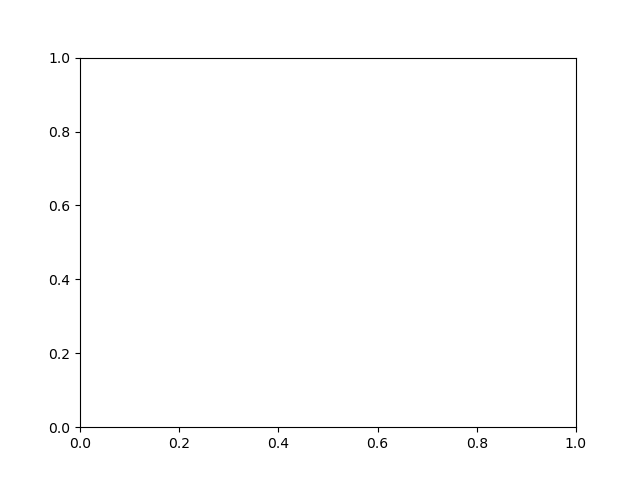

In [48]:
plot_bin_average(intensity_by_frame)

### With shifting

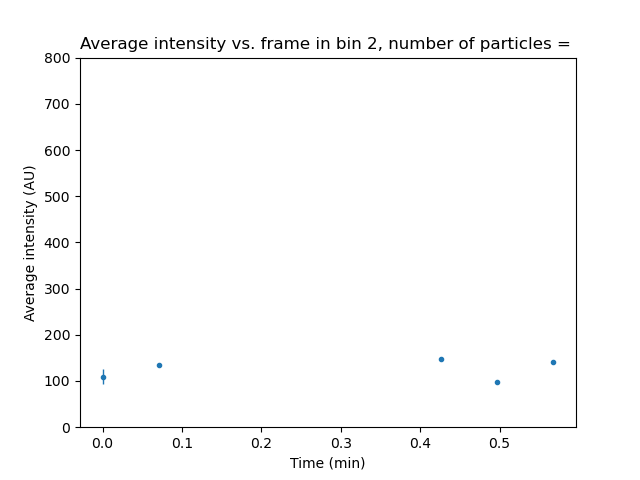

In [55]:
plot_bin_average(intensity_by_frame_shifted)

## Fitting to Averaged Data

### Nick's Fit Functions

In [87]:
# functions copied from Nick's code

import numpy as np
from scipy.optimize import least_squares
from scipy.stats import chi2
# Version with normalization and regularization
def make_half_cycle(basal, t_on, t_dwell, rate, t_interp):
    half_cycle = np.zeros_like(t_interp)
    half_cycle[t_interp < t_on] = basal
    half_cycle[(t_interp >= t_on) & (t_interp < t_on + t_dwell)] = basal + rate * (t_interp[(t_interp >= t_on) & (t_interp < t_on + t_dwell)] - t_on)
    half_cycle[t_interp >= t_on + t_dwell] = basal + rate * t_dwell
    return half_cycle

def fit_func(params, MS2, timepoints, t_interp):
    return np.interp(timepoints, t_interp, make_half_cycle(*params, t_interp)) - MS2

def initial_guess(MS2, timepoints):
    # Initial guess for the parameters
    basal0 = MS2[0]
    t_on0 = timepoints[0]
    t_dwell0 = (2/3)*(timepoints[-1]-timepoints[0])
    rate0 = 1
    # print(np.max(mean_dy_dx))
    return [basal0, t_on0, t_dwell0, rate0]

def fit_half_cycle(MS2, timepoints, t_interp, max_nfev=3000):
    # Initial guess
    x0 = initial_guess(MS2, timepoints)
    
    # Parameter bounds
    lb = [np.min(MS2), 0, 0, 0]  # Ensure t_dwell is non-negative
    ub = [np.max(MS2), np.max(timepoints), np.max(timepoints), 1e7]

    # Scaling factors to normalize parameters
    scale_factors = np.array([np.max(MS2), np.max(timepoints), np.max(timepoints), 100])

    # Scaled bounds
    lb_scaled = np.array(lb) / scale_factors
    ub_scaled = np.array(ub) / scale_factors
    x0_scaled = np.array(x0) / scale_factors

    # Scaled fit function
    def fit_func_scaled(params, MS2, timepoints, t_interp):
        params_unscaled = params * scale_factors
        return fit_func(params_unscaled, MS2, timepoints, t_interp)

    # Perform the fit with regularization
    def residuals_with_regularization(params, MS2, timepoints, t_interp, reg=1e-3):
        residuals = fit_func_scaled(params, MS2, timepoints, t_interp)
        regularization = reg * np.sum(params[:]**2)
        return residuals + regularization

    res = least_squares(residuals_with_regularization, 
                        x0_scaled, bounds=(lb_scaled, ub_scaled), 
                        args=(MS2, timepoints, t_interp), max_nfev=max_nfev)
    
    # Extract and rescale fit parameters
    basal, t_on, t_dwell, rate = res.x * scale_factors
    resnorm = res.cost / len(MS2)  # Normalize residual norm by number of data points
    residual = res.fun * np.max(MS2)

    # Calculate confidence intervals
    J = res.jac
    try:
        pcov = np.linalg.inv(J.T.dot(J)) * res.cost / (len(MS2) - len(res.x))
        perr = np.sqrt(np.diag(pcov))
    except np.linalg.LinAlgError:
        perr = np.full(len(res.x), np.inf)

    alpha = 0.1 # 90% confidence interval
    dof = len(MS2) - len(res.x)
    tval = chi2.ppf(1.0 - alpha / 2., dof)
    
    CI = np.array([res.x - tval * perr, res.x + tval * perr]).T * scale_factors[:, np.newaxis]

    return basal, t_on, t_dwell, rate, residual, resnorm , CI

def first_derivative(x, y):
    """
    Compute the first discrete derivative of y with respect to x.
    Parameters:
    x (numpy.ndarray): Independent variable data points.
    y (numpy.ndarray): Dependent variable data points.
    Returns:
    numpy.ndarray: Discrete first derivative of y with respect to x.
    """
    dx = np.diff(x)
    dy = np.diff(y)
    dydx = dy / dx

    # Use central differences for the interior points and forward/backward differences for the endpoints
    dydx_central = np.zeros_like(y)
    dydx_central[1:-1] = (y[2:] - y[:-2]) / (x[2:] - x[:-2])
    dydx_central[0] = dydx[0]
    dydx_central[-1] = dydx[-1]

    return dydx_central

def mean_sign_intervals(function):
    """
    Compute the mean of function over intervals where the function has a constant sign.
    Parameters:
    derivative (numpy.ndarray): Array representing the function.
    Returns:
    numpy.ndarray: Array with mean values of the function over intervals with constant sign.
    """
    # Identify where the sign changes
    sign_changes = np.diff(np.sign(function))
    # Get indices where the sign changes
    change_indices = np.where(sign_changes != 0)[0] + 1

    # Initialize the list to hold mean values
    mean_values = []
    start_index = 0

    for end_index in change_indices:
        # Calculate the mean of the current interval
        interval_mean = np.mean(function[start_index:end_index])
        # Append the mean value to the list
        mean_values.extend([interval_mean] * (end_index - start_index))
        # Update the start index
        start_index = end_index

    # Handle the last interval
    interval_mean = np.mean(function[start_index:])
    mean_values.extend([interval_mean] * (len(function) - start_index))

    return np.array(mean_values), change_indices

# Function to generate fits for all traces
# def fit_all_traces(traces, tv_denoised_traces):
#     """
#     Fit half-cycles to all traces in the dataset.
#     Parameters:
#     traces (list): List of traces to fit.
#     tv_denoised_traces (list): List of TV denoised traces.
#     Returns:
#     list: List of tuples with fit parameters for each trace.
#     """
#     fit_results = []

#     for i in range(len(traces)):
#         # Compute the first derivative of TV denoised with respect to time
#         dy_dx = first_derivative(traces[i][0], tv_denoised_traces[i])

#         # Compute the mean of the first derivative over intervals with constant sign
#         mean_dy_dx, change_indices = mean_sign_intervals(dy_dx)

#         # Keep datapoints from before first sign change
#         try:
#             timepoints = traces[i][0][:change_indices[0]]
#             MS2 = traces[i][1][:change_indices[0]]

#             # Interpolate the timepoints
#             t_interp = np.linspace(min(timepoints), max(timepoints), 1000)
#         except:
#             print(f"Failed to find derivative sign change for trace {i}")
#             continue


#         # Compute the fit values
#         try:
#             basal, t_on, t_dwell, rate, residual, resnorm, CI = fit_half_cycle(MS2, timepoints, t_interp)

#             fit_results.append([timepoints,t_interp, MS2, make_half_cycle(basal, t_on, t_dwell, rate, t_interp),
#                                 [basal, t_on, t_dwell, rate, residual, resnorm, CI]])
#         except:
#             print(f"Failed to fit trace {i}")
#             fit_results.append([timepoints,t_interp, MS2, None, None])

#     return fit_results

In [89]:
# the fit function that works for my code

def fit_average_traces(timepoints, MS2, tv_denoised_traces):
    # timepoints: the 'frame' column from intensity_by_frame multiplied by time_res_min
    # MS2: the 'average_intensity' column
    # tv_denoised_traces: the 'denoised_average_intensity' column (should run the cell below first)
    """
    Fit half-cycles to all traces in the dataset.
    Parameters:
    traces (list): List of traces to fit.
    tv_denoised_traces (list): List of TV denoised traces.
    Returns:
    list: List of tuples with fit parameters for each trace.
    """
    fit_results = []

    # Compute the first derivative of TV denoised with respect to time
    dy_dx = first_derivative(timepoints, tv_denoised_traces)

    # Compute the mean of the first derivative over intervals with constant sign
    mean_dy_dx, change_indices = mean_sign_intervals(dy_dx)

    # Keep datapoints from before first sign change
    try:
        timepoints = timepoints[:change_indices[0]]
        MS2 = MS2[:change_indices[0]]

        # Interpolate the timepoints
        t_interp = np.linspace(min(timepoints), max(timepoints), 1000)
    except:
        print(f"Failed to find derivative sign change for trace {i}")


    # Compute the fit values
    try:
        basal, t_on, t_dwell, rate, residual, resnorm, CI = fit_half_cycle(MS2, timepoints, t_interp)

        fit_results = [timepoints,t_interp, MS2, make_half_cycle(basal, t_on, t_dwell, rate, t_interp),
                            [basal, t_on, t_dwell, rate, residual, resnorm, CI]]
    except:
        print(f"Failed to fit trace {i}")
        fit_results = [timepoints,t_interp, MS2, None, None]

    return fit_results

### Use Nick's Fit Functions for Actual Data

In [90]:
# A function that denoise the dataframe
def denoise_dataframe(dataframe):
    for bin in range(bin_num):
        try:
            bin_intensity = pd.DataFrame(dataframe[bin])
            bin_intensity = bin_intensity.dropna(subset=['average_intensity']) # remove all nan
    
            # denoise
            before_denoise = np.array(list(bin_intensity['average_intensity']))
            after_denoise = denoise_tv_chambolle(before_denoise, weight=1080, max_num_iter=500)
            
            bin_intensity['denoised_average_intensity'] = after_denoise
            dataframe[bin] = bin_intensity
            
        except:
            continue
    return dataframe

Fitted parameters:
basal: 160.72166591712883, t_on: 0.6081977052106939, t_dwell: 2.941293790571602, rate: 57.08145856378306
Residual norm: 903.6228400751525
basal: [-507.31163723  828.75496907]
t_on: [-15.41315366  16.62954907]
t_dwell: [-38.75136948  44.63395706]
rate: [-315.53769278  429.7006099 ]


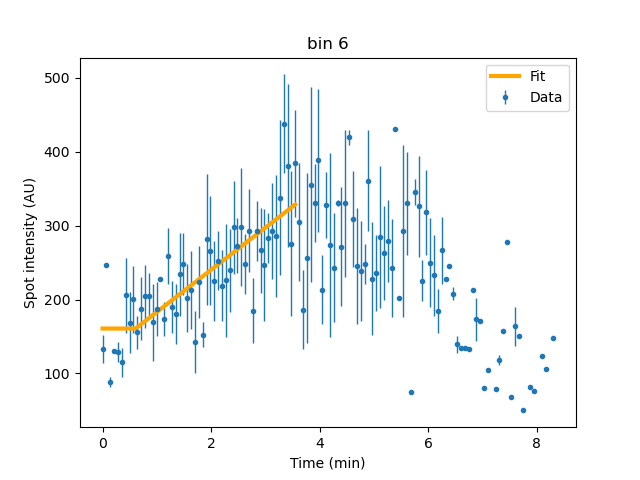

In [817]:
# test cell for plotting
# # def plot_trace(dataframe, bin):
#     # dataframe: intensity_by_frame with "denoised_average_intensity" column added
# dataframe = intensity_by_frame
# curr_bin = 5


# bin_intensity = pd.DataFrame(dataframe[curr_bin])

# y_denoised = np.array(list(bin_intensity['denoised_average_intensity']))
# x = np.array(list(bin_intensity['frame']))*time_res_min
# y = np.array(list(bin_intensity['average_intensity']))
# y_err = np.array(list(bin_intensity['std_err_intensity']))

# fit_result = fit_average_traces(x, y, y_denoised)

# timepoints, t_interp, MS2, half_cycle_fit, [basal, t_on, t_dwell, rate, residual, resnorm, CI] = fit_result

# print("Fitted parameters:")
# print(f"basal: {basal}, t_on: {t_on}, t_dwell: {t_dwell}, rate: {rate}")
# print(f"Residual norm: {resnorm}")

# # Print confidence intervals and parameter names
# param_names = ['basal', 't_on', 't_dwell', 'rate']
# for i, name in enumerate(param_names):
#     print(f"{name}: {CI[i]}")

# plt.figure()
# plt.errorbar(x, y, yerr=y_err, fmt=".", elinewidth=1, label='Data')
# plt.plot(t_interp, make_half_cycle(basal, t_on, t_dwell, rate, t_interp), label="Fit", linewidth=3, color='orange')
# plt.title(f'bin {curr_bin+1}')
# plt.xlabel("Time (min)")
# plt.ylabel("Spot intensity (AU)")
# plt.legend()

In [99]:
# a function that plots the fit for every bin

def plot_bin(dataframe, time_res_min=4.25939/60, NC14_start_frame=None, shifted=False):
    fig, ax = plt.subplots()

    curr_bin = 0

    def update_plot(curr_bin):
        ax.clear()
        try:
            bin_intensity = pd.DataFrame(dataframe[curr_bin])
            try:
                bin_intensity = bin_intensity.dropna(subset=['average_intensity']) # remove all nan
        
                # denoise
                before_denoise = np.array(list(bin_intensity['average_intensity']))
                after_denoise = denoise_tv_chambolle(before_denoise, weight=1080, max_num_iter=500)
                
                bin_intensity['denoised_average_intensity'] = after_denoise
                dataframe[bin] = bin_intensity
            except:
                print('Cannot produce denoised trace')

            # number of particles in NC14 in a bin
            curr_bin_particles = binned_particles[curr_bin]
            NC14_particles = curr_bin_particles[curr_bin_particles['start_frame'] >= 400]
            num = len(NC14_particles)

            y_denoised = np.array(list(bin_intensity['denoised_average_intensity']))
            first_frame = np.array(list(bin_intensity['frame']))[0]
            if shifted == True:
                x = (np.array(list(bin_intensity['frame'])) - first_frame) * time_res_min
            else:
                x = (np.array(list(bin_intensity['frame'])) - NC14_start_frame) * time_res_min
            y = np.array(list(bin_intensity['average_intensity']))
            y_err = np.array(list(bin_intensity['std_err_intensity']))

            fit_result = fit_average_traces(x, y, y_denoised)
            timepoints, t_interp, MS2, half_cycle_fit, [basal, t_on, t_dwell, rate, residual, resnorm, CI] = fit_result

            ax.errorbar(x, y, yerr=y_err, fmt=".", elinewidth=1, label='Data')
            ax.plot(t_interp, make_half_cycle(basal, t_on, t_dwell, rate, t_interp), label=f"Fit (slope = {round(rate, 2)})", linewidth=3, color='orange')

            if shifted == True:
                ax.set_title(f'bin {curr_bin + 1} (shifted), number of particles = {num}')
                ax.set_xlabel("Time (min)")
            else:
                ax.set_title(f'bin {curr_bin + 1}, number of particles = {num}')
                ax.set_xlabel("Time into NC14 (min)")
            ax.set_ylabel("Average intensity (AU)")
            ax.set_xlim(-0.5, 16)
            ax.set_ylim(0,800)
            ax.legend()

            print("Fitted parameters:")
            print(f"basal: {basal}, t_on: {t_on}, t_dwell: {t_dwell}, rate: {rate}")
            print(f"Residual norm: {resnorm}")

            # Print confidence intervals and parameter names
            param_names = ['basal', 't_on', 't_dwell', 'rate']
            for i, name in enumerate(param_names):
                print(f"{name}: {CI[i]}")

        except Exception as e:
            print(f"Error processing bin {curr_bin}: {e}")

        fig.canvas.draw()

    def on_key(event):
        nonlocal curr_bin
        if event.key == 'left':
            curr_bin = max(0, curr_bin - 1)
        elif event.key == 'right':
            curr_bin = min(len(dataframe) - 1, curr_bin + 1)
        update_plot(curr_bin)

    update_plot(curr_bin)
    fig.canvas.mpl_connect('key_press_event', on_key)
    plt.show()

#### Without shifting

Failed to find derivative sign change for trace 1327
Failed to fit trace 1327
Error processing bin 0: local variable 't_interp' referenced before assignment


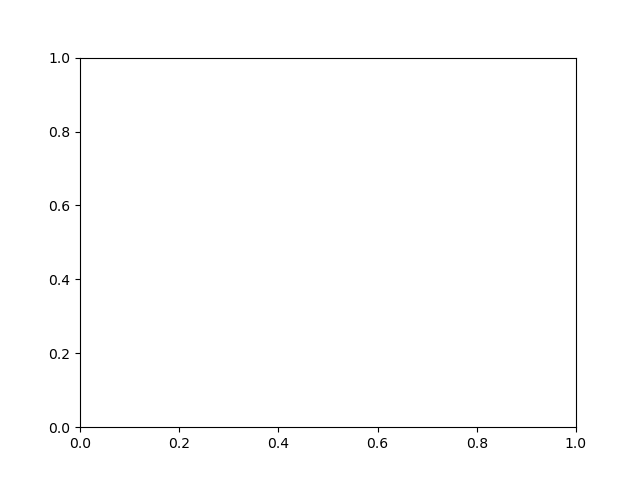

In [101]:
plot_bin(intensity_by_frame, NC14_start_frame=400)

#### With shifting

Failed to fit trace 1327
Error processing bin 0: cannot unpack non-iterable NoneType object


/tmp/ipykernel_1376897/2545556663.py:38: RuntimeWarning: invalid value encountered in divide
  lb_scaled = np.array(lb) / scale_factors
/tmp/ipykernel_1376897/2545556663.py:39: RuntimeWarning: invalid value encountered in divide
  ub_scaled = np.array(ub) / scale_factors
/tmp/ipykernel_1376897/2545556663.py:40: RuntimeWarning: invalid value encountered in divide
  x0_scaled = np.array(x0) / scale_factors


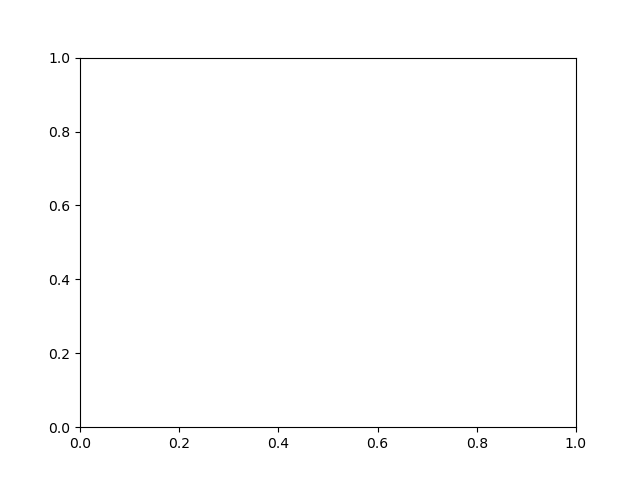

In [102]:
plot_bin(intensity_by_frame_shifted, shifted=True)

### Plot of Slope vs. AP Bin

In [112]:
time_res_min = 4.25939/60
NC14_start_frame = 400

#### Without shifting

In [114]:
dataframe = intensity_by_frame
slopes_unshifted = []

for bin in range(bin_num):
    dataframe = denoise_dataframe(dataframe)
    try:
        bin_intensity = pd.DataFrame(dataframe[bin])

        y_denoised = np.array(list(bin_intensity['denoised_average_intensity']))
        first_frame = np.array(list(bin_intensity['frame']))[0]
        x = (np.array(list(bin_intensity['frame'])) - NC14_start_frame) * time_res_min
        y = np.array(list(bin_intensity['average_intensity']))
        y_err = np.array(list(bin_intensity['std_err_intensity']))
        
        fit_result = fit_average_traces(x, y, y_denoised)
        timepoints, t_interp, MS2, half_cycle_fit, [basal, t_on, t_dwell, rate, residual, resnorm, CI] = fit_result

        slopes_unshifted.append(rate)
        
    except:
        slopes_unshifted.append(np.nan)

Failed to find derivative sign change for trace 1327
Failed to fit trace 1327
Failed to find derivative sign change for trace 1327
Failed to fit trace 1327
Failed to fit trace 1327


/tmp/ipykernel_1376897/2545556663.py:66: RuntimeWarning: invalid value encountered in sqrt
  perr = np.sqrt(np.diag(pcov))
/tmp/ipykernel_1376897/2545556663.py:66: RuntimeWarning: invalid value encountered in sqrt
  perr = np.sqrt(np.diag(pcov))
/tmp/ipykernel_1376897/2545556663.py:66: RuntimeWarning: invalid value encountered in sqrt
  perr = np.sqrt(np.diag(pcov))
/tmp/ipykernel_1376897/2545556663.py:66: RuntimeWarning: invalid value encountered in sqrt
  perr = np.sqrt(np.diag(pcov))


Text(13, -30, 'A')

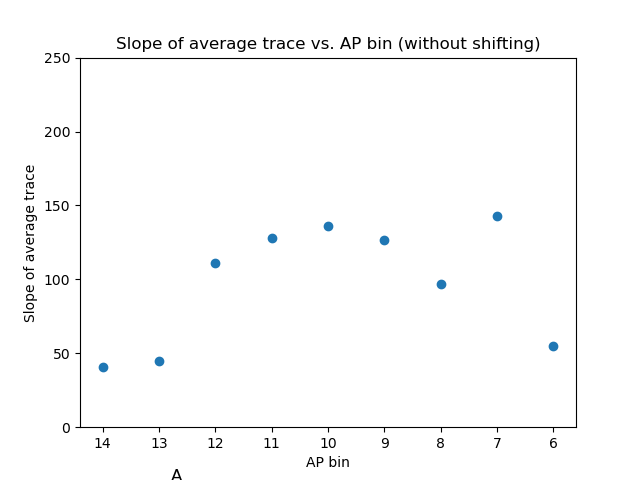

In [115]:
start_bin = 5
end_bin = 14
slope_for_plot = slopes_unshifted[start_bin:end_bin]

plt.figure()
plt.scatter(np.array(range(start_bin, end_bin))+1, slope_for_plot)
plt.xlabel('AP bin')
plt.ylabel('Slope of average trace')
plt.ylim(0,250)
plt.title('Slope of average trace vs. AP bin (without shifting)')
plt.gca().invert_xaxis()

# Adding "A" on the left end of the x-axis
plt.annotate('P', xy=(start_bin, 0), xycoords='data', xytext=(start_bin, -30),
             textcoords='offset points', ha='center', va='top', fontsize=12)

# Adding "P" on the right end of the x-axis
plt.annotate('A', xy=(end_bin-1, 0), xycoords='data', xytext=(end_bin-1, -30),
             textcoords='offset points', ha='center', va='top', fontsize=12)

#### With shifting

In [116]:
dataframe = intensity_by_frame_shifted
slopes_shifted = []

for bin in range(bin_num):
    dataframe = denoise_dataframe(dataframe)
    try:
        bin_intensity = pd.DataFrame(dataframe[bin])
    
        y_denoised = np.array(list(bin_intensity['denoised_average_intensity']))
        first_frame = np.array(list(bin_intensity['frame']))[0]
        x = (np.array(list(bin_intensity['frame'])) - first_frame) * time_res_min
        y = np.array(list(bin_intensity['average_intensity']))
        y_err = np.array(list(bin_intensity['std_err_intensity']))
        
        fit_result = fit_average_traces(x, y, y_denoised)
        timepoints, t_interp, MS2, half_cycle_fit, [basal, t_on, t_dwell, rate, residual, resnorm, CI] = fit_result

        slopes_shifted.append(rate)
        
    except:
        slopes_shifted.append(np.nan)

/tmp/ipykernel_1376897/2545556663.py:38: RuntimeWarning: invalid value encountered in divide
  lb_scaled = np.array(lb) / scale_factors
/tmp/ipykernel_1376897/2545556663.py:39: RuntimeWarning: invalid value encountered in divide
  ub_scaled = np.array(ub) / scale_factors
/tmp/ipykernel_1376897/2545556663.py:40: RuntimeWarning: invalid value encountered in divide
  x0_scaled = np.array(x0) / scale_factors


Failed to fit trace 1327
Failed to find derivative sign change for trace 1327
Failed to fit trace 1327
Failed to find derivative sign change for trace 1327
Failed to fit trace 1327


Text(13, -30, 'A')

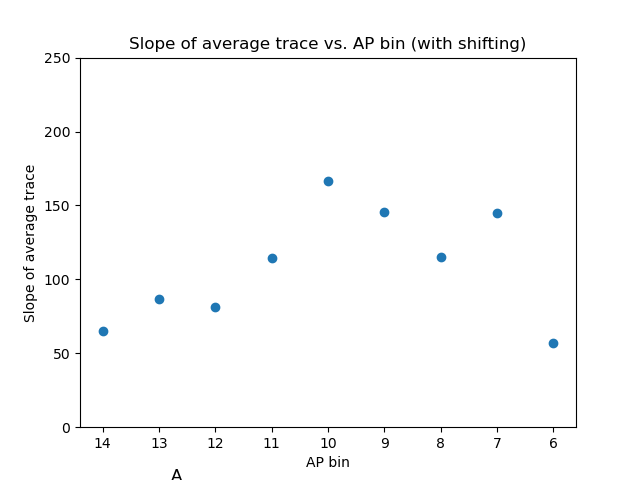

In [117]:
start_bin = 5
end_bin = 14
slope_for_plot = slopes_shifted[start_bin:end_bin]

plt.figure()
plt.scatter(np.array(range(start_bin, end_bin))+1, slope_for_plot)
plt.xlabel('AP bin')
plt.ylabel('Slope of average trace')
plt.ylim(0,250)
plt.title('Slope of average trace vs. AP bin (with shifting)')
plt.gca().invert_xaxis()

# Adding "A" on the left end of the x-axis
plt.annotate('P', xy=(start_bin, 0), xycoords='data', xytext=(start_bin, -30),
             textcoords='offset points', ha='center', va='top', fontsize=12)

# Adding "P" on the right end of the x-axis
plt.annotate('A', xy=(end_bin-1, 0), xycoords='data', xytext=(end_bin-1, -30),
             textcoords='offset points', ha='center', va='top', fontsize=12)

## YJK's method

### Binning & Average

In [118]:
# insert a column indicating the average position of the particle

particle_num = compiled_dataframe.shape[0]

# create a list of mean x position
mean_x = []
for i in range(particle_num):
    mean = np.mean(compiled_dataframe["x"][i])
    mean_x.append(mean)

# create a list of particle start frames
start_frame = []
for i in range(particle_num):
    start = np.min(compiled_dataframe["frame"][i])
    start_frame.append(start)

# append the mean x position to a temporary data frame
compiled_dataframe_temp = compiled_dataframe[:]

compiled_dataframe_temp.insert(compiled_dataframe_temp.shape[1], "mean_x", mean_x)
compiled_dataframe_temp.insert(compiled_dataframe_temp.shape[1], "bin", [None]*particle_num)
compiled_dataframe_temp.insert(compiled_dataframe_temp.shape[1], "start_frame", start_frame)

compiled_dataframe_temp

,particle,frame,t_s,intensity_from_neighborhood,intensity_std_error_from_neighborhood,x,y,mean_x,bin,start_frame
0,1,"[486, 487, 488, 489, 490, 491, 492, 493, 494, ...","[2460.8920001983643, 2465.138999938965, 2469.3...","[312.2417752808989, 239.36774054054055, 261.74...","[48.258007730158944, 51.10832843063577, 45.349...","[816.0128816253126, 815.8107247539169, 816.694...","[169.96654532063292, 169.7021508593274, 169.27...",813.930272,None,486
1,2,"[616, 617, 618, 619, 620, 621, 622, 623, 624, ...","[3015.064001083374, 3019.312000274658, 3023.41...","[78.61329787234042, 172.2497697368421, 105.210...","[46.66242011083243, 51.62949386087655, 49.9161...","[704.863530220381, 704.4787642091378, 704.5966...","[131.97082632583715, 130.9860846929298, 131.93...",705.349331,None,616
2,3,"[523, 524, 525, 526, 527, 528, 529, 530, 531, ...","[2619.1630001068115, 2623.4190006256104, 2627....","[194.74518497109827, 157.8957894736842, 188.48...","[43.11534354278714, 48.54884884993402, 46.5440...","[797.4540223295935, 798.2418502161781, 798.930...","[113.56023983997694, 113.82520703270626, 114.0...",793.276610,None,523
3,4,"[591, 592, 594, 597, 599, 600, 601, 602, 603, ...","[2908.7880001068115, 2913.037000656128, 2921.5...","[114.75271428571429, 183.49992, 119.5002514619...","[43.401897516723324, 46.66763459179819, 43.179...","[828.1150934478264, 830.4877743845481, 829.574...","[152.13494395305608, 150.3216038103879, 150.97...",826.438267,None,591
4,5,"[465, 466, 467, 468, 469, 471, 473, 474, 475, ...","[2353.943000793457, 2358.198999404907, 2362.44...","[131.03238547486032, 137.67305333333334, 201.7...","[46.70524474311073, 50.51775293244764, 49.8382...","[625.9868432780078, 626.4931747381858, 626.005...","[203.99181891789277, 204.1437561886244, 202.78...",621.743993,None,465
...,...,...,...,...,...,...,...,...,...,...
1323,1331,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 15...","[1.8069992065429688, 6.062999725341797, 10.313...","[1353.7865614035088, 1504.4288961038962, 1363....","[84.07152484500466, 87.27623210569732, 81.7150...","[244.29564344655913, 244.9826986127202, 245.42...","[12.698963915346702, 12.4302420472441, 11.8267...",248.842872,None,1
1324,1332,"[1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 14, 15, 16, 1...","[2.006999969482422, 10.715999603271484, 14.966...","[1066.4280649350649, 975.9010273972603, 1067.8...","[74.5284118414619, 85.86387670184509, 76.34063...","[373.20212186442706, 375.41584604606663, 374.5...","[248.4983059870729, 249.44688082206247, 250.50...",376.203182,None,1
1325,1333,[13],[52.739999771118164],[43.69018497109826],[49.85410603500411],[408.2155234174165],[220.75288725990825],408.215523,None,13
1326,1334,"[5, 6, 7, 8, 9]","[18.2189998626709, 22.47599983215332, 26.52699...","[132.4031219512195, 77.9710177514793, 137.8095...","[50.57684452779804, 48.74531959986123, 51.0503...","[5.018386757676929, 5.054798318324925, 5.21269...","[250.18848608202862, 250.17146080014305, 250.6...",5.594935,None,5


In [119]:
# Assign a bin number to each particle

x_dim = 1024 # x dimension of the image
bin_num = 16 # number of bins

bin_part = np.linspace(0, x_dim, bin_num+1) # partition bins

# assign each particle to a bin
for i in range(particle_num): # for each particle
    mean_x = compiled_dataframe_temp["mean_x"][i]
    
    for bin in range(bin_num): # for each bin
        if mean_x >= bin_part[bin] and mean_x < bin_part[bin+1]:
            compiled_dataframe_temp["bin"][i] = bin
        else:
            continue

/tmp/ipykernel_1376897/3087352505.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  compiled_dataframe_temp["bin"][i] = bin
/tmp/ipykernel_1376897/3087352505.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  compiled_dataframe_temp["bin"][i] = bin
/tmp/ipykernel_1376897/3087352505.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  compiled_dataframe_temp["bin"][i] = bin
/tmp/ipykernel_1376897/3087352505.py:14: SettingWithCopyWa

In [120]:
compiled_dataframe_temp

,particle,frame,t_s,intensity_from_neighborhood,intensity_std_error_from_neighborhood,x,y,mean_x,bin,start_frame
0,1,"[486, 487, 488, 489, 490, 491, 492, 493, 494, ...","[2460.8920001983643, 2465.138999938965, 2469.3...","[312.2417752808989, 239.36774054054055, 261.74...","[48.258007730158944, 51.10832843063577, 45.349...","[816.0128816253126, 815.8107247539169, 816.694...","[169.96654532063292, 169.7021508593274, 169.27...",813.930272,12,486
1,2,"[616, 617, 618, 619, 620, 621, 622, 623, 624, ...","[3015.064001083374, 3019.312000274658, 3023.41...","[78.61329787234042, 172.2497697368421, 105.210...","[46.66242011083243, 51.62949386087655, 49.9161...","[704.863530220381, 704.4787642091378, 704.5966...","[131.97082632583715, 130.9860846929298, 131.93...",705.349331,11,616
2,3,"[523, 524, 525, 526, 527, 528, 529, 530, 531, ...","[2619.1630001068115, 2623.4190006256104, 2627....","[194.74518497109827, 157.8957894736842, 188.48...","[43.11534354278714, 48.54884884993402, 46.5440...","[797.4540223295935, 798.2418502161781, 798.930...","[113.56023983997694, 113.82520703270626, 114.0...",793.276610,12,523
3,4,"[591, 592, 594, 597, 599, 600, 601, 602, 603, ...","[2908.7880001068115, 2913.037000656128, 2921.5...","[114.75271428571429, 183.49992, 119.5002514619...","[43.401897516723324, 46.66763459179819, 43.179...","[828.1150934478264, 830.4877743845481, 829.574...","[152.13494395305608, 150.3216038103879, 150.97...",826.438267,12,591
4,5,"[465, 466, 467, 468, 469, 471, 473, 474, 475, ...","[2353.943000793457, 2358.198999404907, 2362.44...","[131.03238547486032, 137.67305333333334, 201.7...","[46.70524474311073, 50.51775293244764, 49.8382...","[625.9868432780078, 626.4931747381858, 626.005...","[203.99181891789277, 204.1437561886244, 202.78...",621.743993,9,465
...,...,...,...,...,...,...,...,...,...,...
1323,1331,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 15...","[1.8069992065429688, 6.062999725341797, 10.313...","[1353.7865614035088, 1504.4288961038962, 1363....","[84.07152484500466, 87.27623210569732, 81.7150...","[244.29564344655913, 244.9826986127202, 245.42...","[12.698963915346702, 12.4302420472441, 11.8267...",248.842872,3,1
1324,1332,"[1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 14, 15, 16, 1...","[2.006999969482422, 10.715999603271484, 14.966...","[1066.4280649350649, 975.9010273972603, 1067.8...","[74.5284118414619, 85.86387670184509, 76.34063...","[373.20212186442706, 375.41584604606663, 374.5...","[248.4983059870729, 249.44688082206247, 250.50...",376.203182,5,1
1325,1333,[13],[52.739999771118164],[43.69018497109826],[49.85410603500411],[408.2155234174165],[220.75288725990825],408.215523,6,13
1326,1334,"[5, 6, 7, 8, 9]","[18.2189998626709, 22.47599983215332, 26.52699...","[132.4031219512195, 77.9710177514793, 137.8095...","[50.57684452779804, 48.74531959986123, 51.0503...","[5.018386757676929, 5.054798318324925, 5.21269...","[250.18848608202862, 250.17146080014305, 250.6...",5.594935,0,5


In [121]:
# sort particles by bins

binned_particles = [None]*bin_num

for bin in range(bin_num): # for each bin
    mask = compiled_dataframe_temp["bin"] == bin
    binned_particles[bin] = compiled_dataframe_temp[mask]

binned_particles[12]

,particle,frame,t_s,intensity_from_neighborhood,intensity_std_error_from_neighborhood,x,y,mean_x,bin,start_frame
0,1,"[486, 487, 488, 489, 490, 491, 492, 493, 494, ...","[2460.8920001983643, 2465.138999938965, 2469.3...","[312.2417752808989, 239.36774054054055, 261.74...","[48.258007730158944, 51.10832843063577, 45.349...","[816.0128816253126, 815.8107247539169, 816.694...","[169.96654532063292, 169.7021508593274, 169.27...",813.930272,12,486
2,3,"[523, 524, 525, 526, 527, 528, 529, 530, 531, ...","[2619.1630001068115, 2623.4190006256104, 2627....","[194.74518497109827, 157.8957894736842, 188.48...","[43.11534354278714, 48.54884884993402, 46.5440...","[797.4540223295935, 798.2418502161781, 798.930...","[113.56023983997694, 113.82520703270626, 114.0...",793.276610,12,523
3,4,"[591, 592, 594, 597, 599, 600, 601, 602, 603, ...","[2908.7880001068115, 2913.037000656128, 2921.5...","[114.75271428571429, 183.49992, 119.5002514619...","[43.401897516723324, 46.66763459179819, 43.179...","[828.1150934478264, 830.4877743845481, 829.574...","[152.13494395305608, 150.3216038103879, 150.97...",826.438267,12,591
12,13,"[620, 622, 623, 624, 625, 626, 627, 628, 629, ...","[3032.923999786377, 3041.4190006256104, 3045.6...","[178.00075757575758, 133.63512865497077, 144.6...","[50.034004234870345, 41.43627203486614, 44.743...","[803.4203632444618, 801.9576930746124, 801.902...","[227.4350772771209, 228.16390573844973, 227.72...",800.476755,12,620
21,22,"[632, 635, 636, 638, 639, 640, 641, 642, 643, ...","[3083.859001159668, 3096.404001235962, 3100.86...","[213.34527272727271, 141.11465217391304, 108.1...","[43.59663685906847, 50.028908830526746, 51.516...","[788.1814759631841, 788.8962965930089, 789.119...","[184.38236551951059, 184.41679665522298, 184.2...",787.573408,12,632
...,...,...,...,...,...,...,...,...,...,...
1309,1317,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[2.006999969482422, 6.062999725341797, 10.5159...","[1340.0328444444444, 1329.2872457142857, 1307....","[79.495138136966, 75.38959132967048, 73.129646...","[823.9873394506576, 825.1166150784088, 824.276...","[9.943819838796761, 10.092025548209001, 8.8800...",820.576129,12,1
1314,1322,[34],[143.6029987335205],[78.06603314917128],[47.22579650326229],[817.022465621828],[155.9709879885791],817.022466,12,34
1315,1323,[33],[136.88299942016602],[82.93141279069768],[49.22083322534756],[826.154309207389],[63.4889203515084],826.154309,12,33
1322,1330,[24],[98.52699851989746],[82.779625],[50.11542673382831],[778.7133623070058],[109.96685579733905],778.713362,12,24


In [122]:
# sort intensity data based on bin and frame

intensity_by_frame = [[] for _ in range(bin_num)]

for bin in range(bin_num):
        
    # find the max and min frame number in a bin
    try:
        max_frame = max(binned_particles[bin]["frame"].apply(max))
        min_frame = min(binned_particles[bin]["frame"].apply(min))
        
        intensity_by_frame[bin] = pd.DataFrame({'frame': range(min_frame,max_frame), 
                             'intensity': [[] for _ in range(0,max_frame-min_frame)], 
                             'average_intensity': [None for _ in range(0,max_frame-min_frame)],
                            'std_err_intensity': [None for _ in range(0,max_frame-min_frame)]})
        
        bin_particle_num = binned_particles[bin].shape[0]
        
        intensity_list = [[]]*(max_frame-min_frame)
        for frame in range(min_frame, max_frame): # for each frame along the movie
            FrameIndex = frame - min_frame
            
            for particle in range(bin_particle_num): # for each particle in the bin
                particle_frames = np.array(binned_particles[bin])[particle][1] # extract the frame list of a single particle
                particle_intensity = np.array(binned_particles[bin])[particle][3] # extract the intensity list of a single particle
                
                for el in range(len(particle_frames)): # for each frame of this particle
                    if particle_frames[el] == frame:
                        # add the intensity value of this particle at this frame to the new data structure
                        intensity_by_frame[bin]['intensity'][FrameIndex].append(particle_intensity[el])
    except:
        continue

In [123]:
# for each bin, calculate the average intensity in each frame along with the standard error

for bin in range(bin_num):
    try:
        frame_num = intensity_by_frame[bin].shape[0]
        for frame in range(frame_num):
            intensity_data = intensity_by_frame[bin]['intensity'][frame]
            intensity_by_frame[bin]['average_intensity'][frame] = np.mean(intensity_data)
            intensity_by_frame[bin]['std_err_intensity'][frame] = np.std(intensity_data)/np.sqrt(len(intensity_data))
    except:
        continue

/tmp/ipykernel_1376897/902731023.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  intensity_by_frame[bin]['average_intensity'][frame] = np.mean(intensity_data)
/tmp/ipykernel_1376897/902731023.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  intensity_by_frame[bin]['std_err_intensity'][frame] = np.std(intensity_data)/np.sqrt(len(intensity_data))
/tmp/ipykernel_1376897/902731023.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  

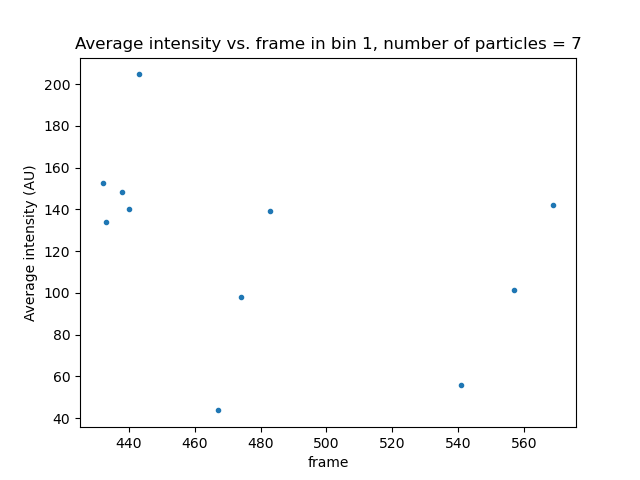

In [127]:
%matplotlib widget
# This is taken from https://stackoverflow.com/questions/18390461/scroll-backwards-and-forwards-through-matplotlib-plots
import matplotlib.pyplot as plt

from scipy.signal import medfilt

curr_bin = 0


def key_event1(e):
    global curr_bin

    if e.key == "right":
        curr_bin = curr_bin + 1
    elif e.key == "left":
        curr_bin = curr_bin - 1
    else:
        return
    curr_bin = curr_bin % bin_num

    NC14_mask = list(intensity_by_frame[curr_bin]['frame'] >= 400) # take 400 as the start of NC14

    # number of particles in NC14 in a bin
    curr_bin_particles = binned_particles[curr_bin]
    NC14_particles = curr_bin_particles[curr_bin_particles['start_frame'] >= 400]
    num = len(NC14_particles)
    
    x = intensity_by_frame[curr_bin]['frame'][NC14_mask]
    y = intensity_by_frame[curr_bin]['average_intensity'][NC14_mask]
    y_err = intensity_by_frame[curr_bin]['std_err_intensity'][NC14_mask]
    
    ax.cla()
    
    ax.errorbar(x, 
                y, 
                yerr=y_err,
                fmt=".",
                elinewidth=1,)
    
    ax.set_xlabel("frame")
    ax.set_ylabel("Average intensity (AU)")
    ax.set_title(f"Average intensity vs. frame in bin {curr_bin+1}, number of particles = {num}")
    fig.canvas.draw()


fig = plt.figure()
fig.canvas.mpl_connect("key_press_event", key_event1)

ax = fig.add_subplot(111)

NC14_mask = list(intensity_by_frame[curr_bin]['frame'] >= 400)

# number of particles in NC14 in a bin
curr_bin_particles = binned_particles[curr_bin]
NC14_particles = curr_bin_particles[curr_bin_particles['start_frame'] >= 400]
num = len(NC14_particles)

x = intensity_by_frame[curr_bin]['frame'][NC14_mask]
y = intensity_by_frame[curr_bin]['average_intensity'][NC14_mask]
y_err = intensity_by_frame[curr_bin]['std_err_intensity'][NC14_mask]

ax.errorbar(x, 
            y, 
            yerr=y_err,
            fmt=".",
            elinewidth=1,)

ax.set_xlabel("frame")
ax.set_ylabel("Average intensity (AU)")
ax.set_title(f"Average intensity vs. frame in bin {curr_bin+1}, number of particles = {num}")
plt.show()

# Note that here bin 16 is empty so you will see a plot with nothing

Same plot but with time into NC14 on x axis

In [128]:
# convert frames to time into NC14

def Frame_to_TimeIntoNC14(frames, time_per_frame, NC14_start_frame):
    # frames: array of frame number
    # time_per_frame: the time elapsed per frame in seconds
    # NC14_start_frame: the frame when NC14 started
    # output: an array of time into NC14 in minute
    return (frames - NC14_start_frame)*time_per_frame/60

In [129]:
# Only for this data set
time_per_frame = 4.25939
NC14_start_frame = 400

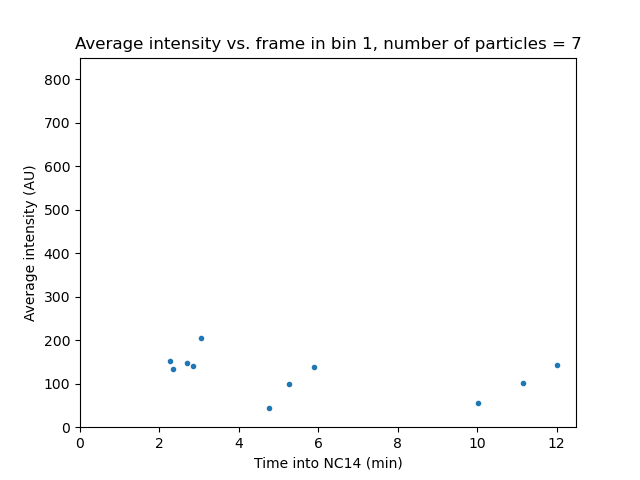

In [130]:
%matplotlib widget
# This is taken from https://stackoverflow.com/questions/18390461/scroll-backwards-and-forwards-through-matplotlib-plots
import matplotlib.pyplot as plt

from scipy.signal import medfilt

curr_bin = 0


def key_event1(e):
    global curr_bin

    if e.key == "right":
        curr_bin = curr_bin + 1
    elif e.key == "left":
        curr_bin = curr_bin - 1
    else:
        return
    curr_bin = curr_bin % bin_num

    NC14_mask = list(intensity_by_frame[curr_bin]['frame'] >= 400) # take 400 as the start of NC14

    # number of particles in NC14 in a bin
    curr_bin_particles = binned_particles[curr_bin]
    NC14_particles = curr_bin_particles[curr_bin_particles['start_frame'] >= 400]
    num = len(NC14_particles)
    
    x = (intensity_by_frame[curr_bin]['frame'][NC14_mask] - 400)*4.25939/60
    y = intensity_by_frame[curr_bin]['average_intensity'][NC14_mask]
    y_err = intensity_by_frame[curr_bin]['std_err_intensity'][NC14_mask]
    
    ax.cla()
    
    ax.errorbar(x, 
                y, 
                yerr=y_err,
                fmt=".",
                elinewidth=1,)
    
    ax.set_xlabel("Time into NC14 (min)")
    ax.set_ylabel("Average intensity (AU)")
    ax.set_xlim(0,)
    ax.set_ylim(0,850)
    ax.set_title(f"Average intensity vs. frame in bin {curr_bin+1}, number of particles = {num}")
    fig.canvas.draw()


fig = plt.figure()
fig.canvas.mpl_connect("key_press_event", key_event1)

ax = fig.add_subplot(111)

NC14_mask = list(intensity_by_frame[curr_bin]['frame'] >= 400)

# number of particles in NC14 in a bin
curr_bin_particles = binned_particles[curr_bin]
NC14_particles = curr_bin_particles[curr_bin_particles['start_frame'] >= 400]
num = len(NC14_particles)

x = Frame_to_TimeIntoNC14(intensity_by_frame[curr_bin]['frame'][NC14_mask], time_per_frame, NC14_start_frame)
y = intensity_by_frame[curr_bin]['average_intensity'][NC14_mask]
y_err = intensity_by_frame[curr_bin]['std_err_intensity'][NC14_mask]

ax.errorbar(x, 
            y, 
            yerr=y_err,
            fmt=".",
            elinewidth=1,)

ax.set_xlabel("Time into NC14 (min)")
ax.set_ylabel("Average intensity (AU)")
ax.set_xlim(0,)
ax.set_ylim(0,850)
ax.set_title(f"Average intensity vs. frame in bin {curr_bin+1}, number of particles = {num}")
plt.show()

# Note that here bin 16 is empty so you will see a plot with nothing

In [131]:
plt.close()

### YJK's Fit Functions

In [132]:
# function to fit piecewise curve with a low constant portion, a linear increase portion, a high constant portion, and a decay portion
# install the package first by running !pip install scipy

#!pip install scipy

from scipy.optimize import curve_fit

def piecewise_linear(x, a, v1, m, b, c):
    # x = np.asarray(x)  # Ensure x is a numpy array

    # Create an array to hold the results
    result = np.full_like(x, np.nan)  # Start with all values as NaN

    # Apply the piecewise conditions
    mask1 = x < a
    mask2 = (x >= a) & (x < b)
    mask3 = (x >= b) & (x < c)
    mask4 = x >= c

    result[mask1] = v1
    result[mask2] = v1 + m*(x[mask2] - a)
    result[mask3] = v1 + m * (b - a)
    result[mask4] = 0

    return result


def fit_piecewise_linear(x, y, y_err):
    p0 = [0, np.min(y), 10, 0, np.max(x)]
    popt, pcov = curve_fit(piecewise_linear, x, y, sigma=y_err, p0=p0)
    return popt, pcov

In [133]:
# YJK's fit functions

import numpy as np
from scipy.optimize import least_squares

def make_whole_cycle(basal, t_on, t_dwell, t_active, tau, rate, t_interp):
    signal = np.zeros_like(t_interp)  # Output signal
    dt = t_interp[1] - t_interp[0]    # Time resolution
    ind_shift = int(np.floor(t_dwell / dt))  # Number of indices to shift for dwell time

    # Generate loading rate
    rate_cycle = np.full_like(t_interp, np.nan)  # Loading rate for the nuclear cycle
    rate_cycle[t_interp < t_on] = 0
    mask1 = (t_interp >= t_on) & (t_interp < (t_on + t_dwell + t_active))
    rate_cycle[mask1] = rate

    for i in range(len(t_interp)):
        if t_interp[i] >= (t_on + t_dwell + t_active):
            rate_cycle[i] = rate * np.exp(-(t_interp[i] - t_on - t_dwell - t_active) / tau)

    # Generate signal
    for i in range(1, len(t_interp)):
        if t_interp[i] > t_on and t_interp[i] <= (t_on + t_dwell):
            signal[i] = signal[i-1] + dt * rate_cycle[i-1]
        elif t_interp[i] > (t_on + t_dwell):
            if (i-1-ind_shift) < 0:  # Check for zero indexing error
                ind_shift = ind_shift - 1
            signal[i] = signal[i-1] + (rate_cycle[i-1] - rate_cycle[i-1-ind_shift]) * dt

    # Add basal fluorescence
    signal[signal < basal] = basal

    return signal

def fit_func(params, MS2, timepoints, t_interp):
    return np.interp(timepoints, t_interp, make_whole_cycle(*params, t_interp)) - MS2

def fit_whole_cycle(MS2, timepoints, t_interp, max_nfev=1000, initial_guess=[200,0,6.5,0.5,0.5,100]):
    # Initial guesses for the parameters
    basal0 = initial_guess[0]
    t_on0 = initial_guess[1]
    t_dwell0 = initial_guess[2]
    t_active0 = initial_guess[3]
    tau0 = initial_guess[4]
    rate0 = initial_guess[5]
    x0 = [basal0, t_on0, t_dwell0, t_active0, tau0, rate0]

    # Parameter bounds
    lb = [np.min(MS2), 0, 0, -2, 0, 0]
    ub = [np.max(MS2), 20, 20, 30, 50, 1e7]

    # Perform the fit
    res = least_squares(fit_func, x0, bounds=(lb, ub), args=(MS2, timepoints, t_interp), max_nfev=max_nfev)

    # Extract fit parameters
    basal, t_on, t_dwell, t_active, tau, rate = res.x
    resnorm = res.cost / len(MS2)  # Normalize residual norm by number of datapoints
    residual = res.fun

    # Calculate confidence intervals
    from scipy.stats import chi2
    alpha = 0.05  # 95% confidence interval
    dof = len(MS2) - len(res.x)
    tval = chi2.ppf(1.0 - alpha / 2., dof)

    pcov = np.linalg.inv(res.jac.T.dot(res.jac)) * res.cost / dof
    perr = np.sqrt(np.diag(pcov))
    CI = np.array([res.x - tval * perr, res.x + tval * perr]).T

    return basal, t_on, t_dwell, t_active, tau, rate, residual, resnorm, CI


### Use YJK's Fit Functions for Actual Data

In [134]:
# Keep only NC14 particles

NC14_mask = list(intensity_by_frame[curr_bin]['frame'] >= 400)

intensity_by_frame_NC14 = [None for bin in range(bin_num)]
for bin in range(bin_num):
    try:
        data = intensity_by_frame[bin]
        filtered_data = data[data['frame'] >= 400]
        intensity_by_frame_NC14[bin] = filtered_data
    except:
        continue

intensity_by_frame_NC14[10]

,frame,intensity,average_intensity,std_err_intensity
399,400,[],NaN,NaN
400,401,[],NaN,NaN
401,402,[],NaN,NaN
402,403,[],NaN,NaN
403,404,[],NaN,NaN
...,...,...,...,...
646,647,"[202.3868988764045, 114.93558479532163, 234.33...",147.888569,28.207858
647,648,"[269.70528488372094, 154.64302352941175, 112.0...",157.675589,23.545769
648,649,"[219.43915555555557, 102.81589677419353, 204.3...",167.608953,19.470498
649,650,"[232.11513291139244, 227.02103508771933, 39.50...",185.422438,33.332869


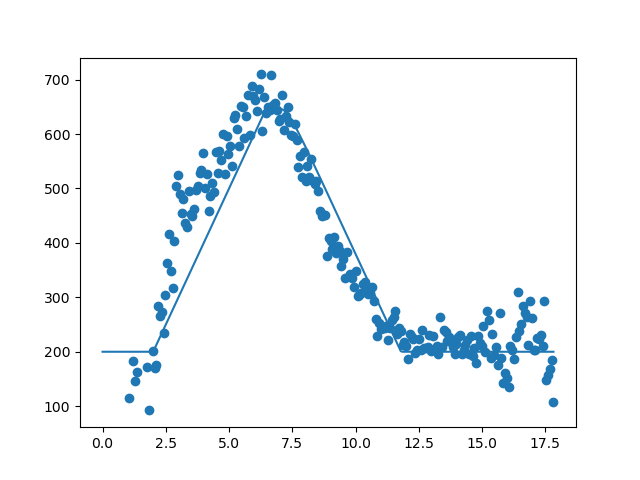

In [135]:
# Visualize the datapoints in a bin and make initial guesses

curr_bin = 10

x = Frame_to_TimeIntoNC14(np.array(list(intensity_by_frame_NC14[curr_bin]['frame'])), time_per_frame = 4.25939, NC14_start_frame = 400)
y = np.array(list(intensity_by_frame_NC14[curr_bin]['average_intensity']))

plt.figure()
plt.scatter(x,y)
plt.plot(x, make_whole_cycle(200,0,6.5,0.5,0.3,100,x))

In [136]:
# # Unfinished cell
# # A function that takes in NC14 averaged data and generates a fit

# def bin_average_fit(dataframe, bin, time_per_frame, NC14_start_frame, x0=[200,0,6.5,0.5,0.5,100]):
#     # dataframe: a pandas dataframe generated from the "Binning & Average" section above, with columns "frame" & "average_intensity"
#     # x0: initial guess for fit_whole_cycle, the fit function used here
#     # initial_guess = [basal0, t_on0, t_dwell0, t_active0, tau0, rate0]

#     frame_data = np.array(list(intensity_by_frame_NC14[bin]['frame']))
#     x = Frame_to_TimeIntoNC14(frame_data, time_per_frame, NC14_start_frame)
#     y = np.array(list(dataframe[bin]['average_intensity']))

#     nan_mask = np.isnan(y)==False
#     timepoints = x[nan_mask]
#     MS2 = y[nan_mask]
#     t_interp = np.linspace(min(timepoints), max(timepoints), 1000)

#     basal, t_on, t_dwell, t_active, tau, rate, residual, resnorm, CI = fit_whole_cycle(MS2, timepoints, t_interp, max_nfev=2000, initial_guess=x0)
    
#     print("Fitted parameters:")
#     print(f"basal: {basal}, t_on: {t_on}, t_dwell: {t_dwell}, t_active: {t_active}, tau: {tau}, rate: {rate}")
#     print(f"Residual norm: {resnorm}")
    
#     # Print confidence intervals and parameter names
#     param_names = ['basal', 't_on', 't_dwell', 't_active', 'tau', 'rate']
#     for i, name in enumerate(param_names):
#         print(f"{name}: {CI[i]}")
    
#     # Plot the fit
#     plt.figure()
#     plt.scatter(timepoints, MS2, label='Data')
#     plt.plot(t_interp, make_whole_cycle(basal, t_on, t_dwell, t_active, tau, rate, t_interp), label='Fit', color='orange')
#     plt.xlabel('Time')
#     plt.ylabel('Signal')
#     plt.title(f'Fit of whole cycle (bin {bin+1})')
#     plt.legend()
#     plt.show()

#     return rate

In [137]:
# A function that plots the bin average & fit for a bin
# This function needs refinement

def PlotTrace(dataframe, bin, x0=[200,0,6.5,0.5,0.5,100]):
    # initial_guess = [basal0, t_on0, t_dwell0, t_active0, tau0, rate0]

    NC14_mask = list(dataframe[bin]['frame'] >= 400)

    x = np.array(list((dataframe[bin]['frame'][NC14_mask] - 400)*4.25939/60))
    y = np.array(list(dataframe[bin]['average_intensity'][NC14_mask]))
    y_err = np.array(list(dataframe[bin]['std_err_intensity'][NC14_mask]))

    nan_mask = np.isnan(y)==False
    timepoints = x[nan_mask]
    MS2 = y[nan_mask]
    MS2_err = y_err[nan_mask]
    t_interp = np.linspace(min(timepoints), max(timepoints), 1000)

    basal, t_on, t_dwell, t_active, tau, rate, residual, resnorm, CI = fit_whole_cycle(MS2, timepoints, t_interp, max_nfev=2000, initial_guess=x0)
    
    print("Fitted parameters:")
    print(f"basal: {basal}, t_on: {t_on}, t_dwell: {t_dwell}, t_active: {t_active}, tau: {tau}, rate: {rate}")
    print(f"Residual norm: {resnorm}")
    
    # Print confidence intervals and parameter names
    param_names = ['basal', 't_on', 't_dwell', 't_active', 'tau', 'rate']
    for i, name in enumerate(param_names):
        print(f"{name}: {CI[i]}")

    curr_bin_particles = binned_particles[curr_bin]
    NC14_particles = curr_bin_particles[curr_bin_particles['start_frame'] >= 400]
    num = len(NC14_particles)
    
    # Plot the fit
    plt.figure()
    plt.errorbar(timepoints, MS2, yerr=MS2_err, fmt=".", elinewidth=1, label='Data')
    plt.plot(t_interp, make_whole_cycle(basal, t_on, t_dwell, t_active, tau, rate, t_interp), label=f'Fit (slope = {round(rate,2)})', color='orange')
    plt.xlabel('Time')
    plt.ylabel('Average intensity (AU)')
    plt.xlim(-0.5, 16)
    plt.ylim(0,800)
    plt.title(f'bin {bin+1}, number of particles = {num}')
    plt.legend()
    plt.show()

    return rate

Fitted parameters:
basal: 210.96188752006992, t_on: 0.026967532994947144, t_dwell: 4.846752672580788, t_active: -0.7095328311642514, tau: 4.579450806160883, rate: 169.9009822401484
Residual norm: 1210.2388680145466
basal: [-771.58670928 1193.51048432]
t_on: [-1.00388913e+08  1.00388913e+08]
t_dwell: [-1.04671917e+08  1.04671927e+08]
t_active: [-53551144.65958335  53551143.24051768]
tau: [-77.01747274  86.17637435]
rate: [-400.47208665  740.27405113]


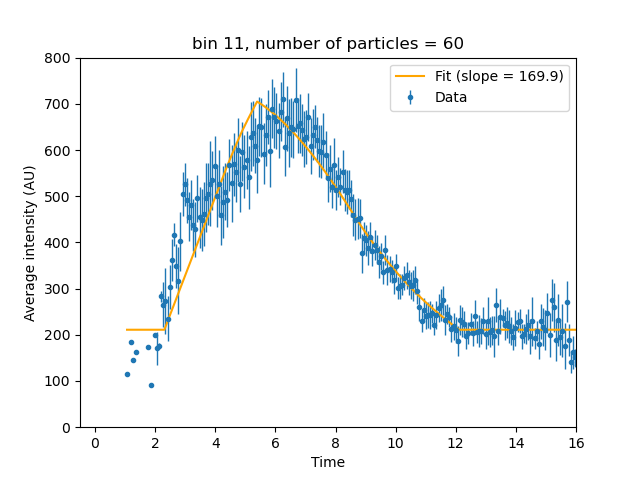

In [138]:
rate = PlotTrace(intensity_by_frame,10)

Fitted parameters:
basal: 147.58626039338992, t_on: 0.09278012952999283, t_dwell: 4.651409452938951, t_active: -0.09823273380402411, tau: 0.8849739648608077, rate: 78.9485532511862
Residual norm: 1790.3770361249717
basal: [-255.54526801  550.7177888 ]
t_on: [-3.26373331e+09  3.26373331e+09]
t_dwell: [-4.34048482e+09  4.34048483e+09]
t_active: [-1.19349225e+09  1.19349225e+09]
tau: [-4449.13872107  4450.908669  ]
rate: [-34018.50932435  34176.40643085]


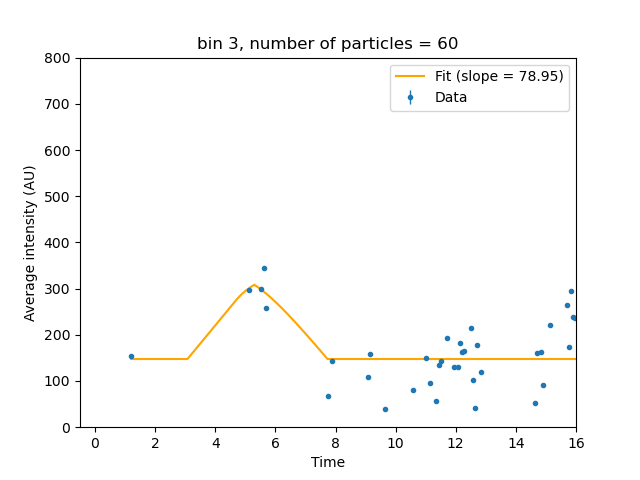

Fitted parameters:
basal: 168.26306057422266, t_on: 0.07938421382707142, t_dwell: 5.695095656899818, t_active: -0.6412740484315895, tau: 11.48912876155011, rate: 136.35633854322592
Residual norm: 1014.6861831878059
basal: [-934.23489735 1270.76101849]
t_on: [-1.46478798e+08  1.46478798e+08]
t_dwell: [-2.28093389e+08  2.28093400e+08]
t_active: [-90565735.23672584  90565733.95417774]
tau: [-503.26632945  526.24458697]
rate: [-846.40948874 1119.12216583]


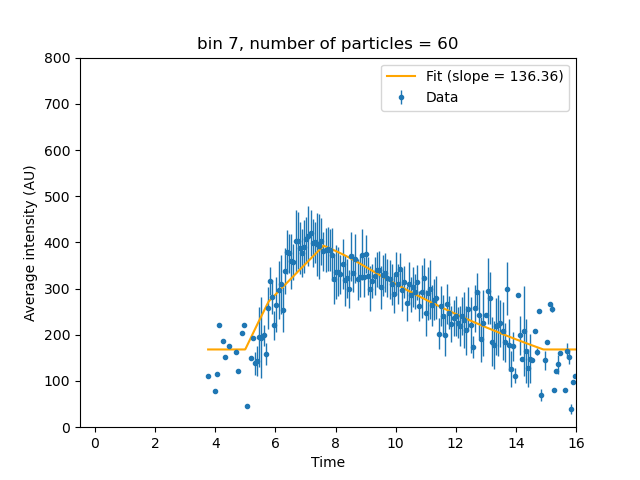

Fitted parameters:
basal: 208.1149761569045, t_on: 0.02920361524409198, t_dwell: 5.6430903806536525, t_active: -1.365372613217152, tau: 8.488349084190281, rate: 190.0421700825392
Residual norm: 1106.927780975525
basal: [-811.70163445 1227.93158676]
t_on: [-95392934.94617634  95392935.00458355]
t_dwell: [-1.13509934e+08  1.13509946e+08]
t_active: [-72011569.56982487  72011566.83907965]
tau: [-143.50659213  160.4832903 ]
rate: [-2896.33628101  3276.42062118]


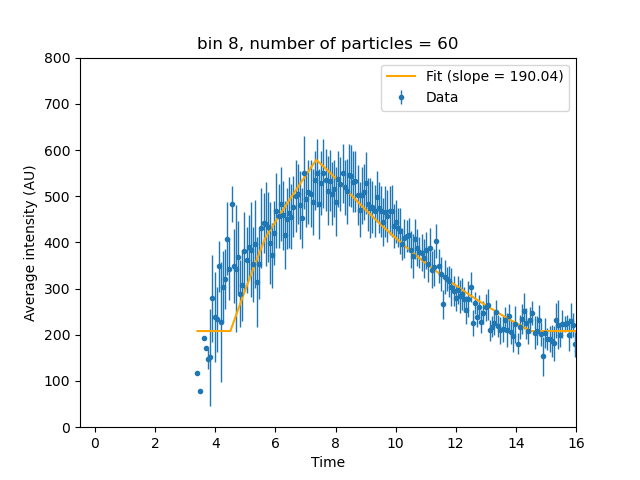

Fitted parameters:
basal: 226.2493383322437, t_on: 0.005268190299638182, t_dwell: 5.8714705723484, t_active: -0.6079235157265721, tau: 4.183211114754712, rate: 157.6402435958008
Residual norm: 706.0116369075757
basal: [-481.0181786   933.51685527]
t_on: [-69331364.14573519  69331364.15627156]
t_dwell: [-84048972.67583576  84048984.4187769 ]
t_active: [-69575800.11273943  69575798.89689238]
tau: [-81.67374648  90.04016871]
rate: [-286.30245847  601.58294566]


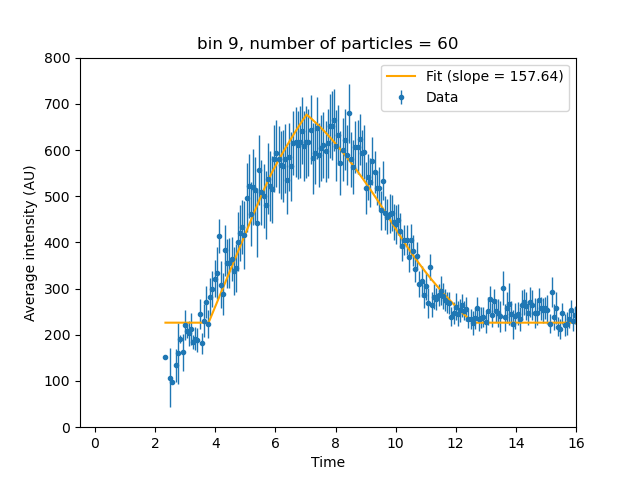

Fitted parameters:
basal: 241.961275647116, t_on: 0.011632242475046132, t_dwell: 5.599691396122288, t_active: -0.8724569035199566, tau: 3.6336923398468466, rate: 193.57771207487835
Residual norm: 1088.2993949578347
basal: [-591.49853106 1075.42108236]
t_on: [-67616581.11440077  67616581.13766527]
t_dwell: [-1.24719515e+08  1.24719526e+08]
t_active: [-91901545.64847027  91901543.90355645]
tau: [-68.58882799  75.85621267]
rate: [-605.62833773  992.78376188]


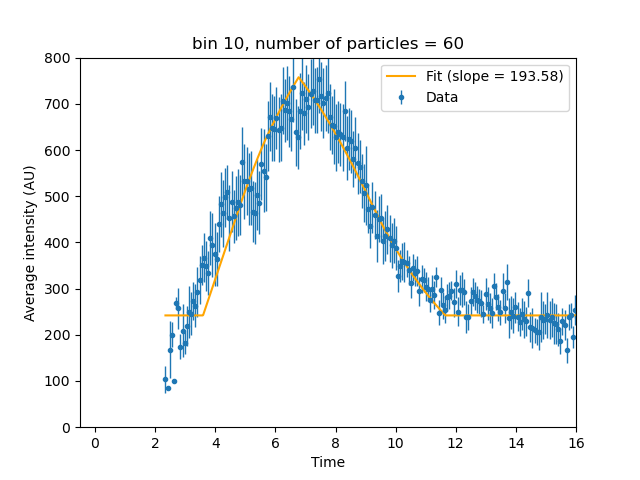

Fitted parameters:
basal: 210.96188752006992, t_on: 0.026967532994947144, t_dwell: 4.846752672580788, t_active: -0.7095328311642514, tau: 4.579450806160883, rate: 169.9009822401484
Residual norm: 1210.2388680145466
basal: [-771.58670928 1193.51048432]
t_on: [-1.00388913e+08  1.00388913e+08]
t_dwell: [-1.04671917e+08  1.04671927e+08]
t_active: [-53551144.65958335  53551143.24051768]
tau: [-77.01747274  86.17637435]
rate: [-400.47208665  740.27405113]


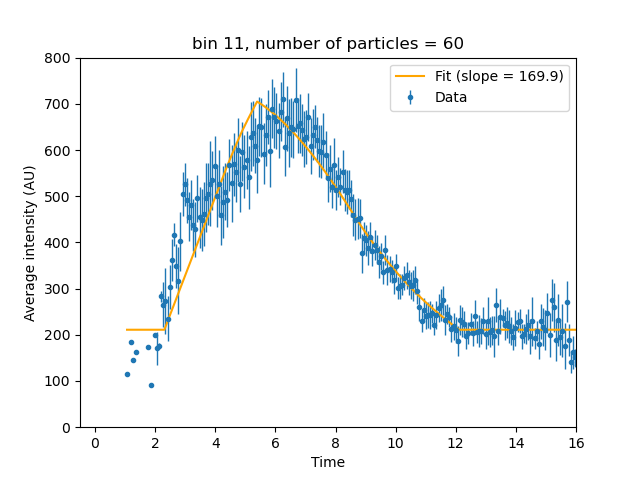

Fitted parameters:
basal: 209.4160900036408, t_on: 0.007636055867587046, t_dwell: 4.4842270873771986, t_active: -1.9915791338228968, tau: 8.487155804579265, rate: 155.82844244783954
Residual norm: 1101.4904139962498
basal: [-738.13090102 1156.96308102]
t_on: [-1.69171517e+08  1.69171517e+08]
t_dwell: [-2.87474096e+08  2.87474105e+08]
t_active: [-1.72098046e+08  1.72098042e+08]
tau: [-198.74376715  215.71807876]
rate: [-1431.40349085  1743.06037574]


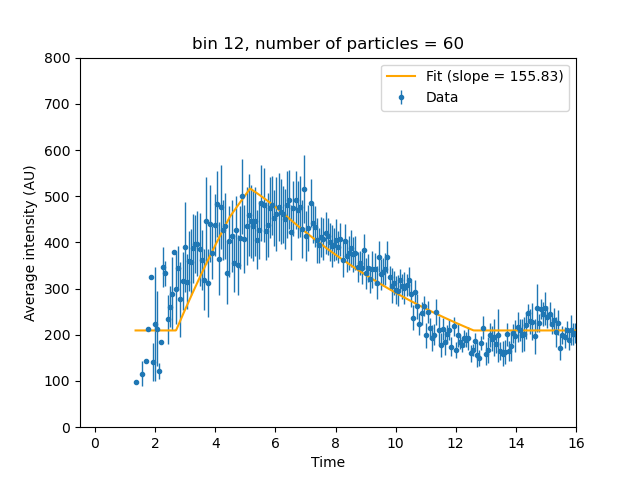

Fitted parameters:
basal: 224.55067762018325, t_on: 0.005305894023458021, t_dwell: 3.716863870460587, t_active: -1.9973618965445858, tau: 6.281355910006761, rate: 178.52241427475937
Residual norm: 1734.7937524946847
basal: [-751.75715636 1200.8585116 ]
t_on: [-2.72629147e+08  2.72629147e+08]
t_dwell: [-4.50040512e+08  4.50040520e+08]
t_active: [-2.85796755e+08  2.85796751e+08]
tau: [-448.14868862  460.71140044]
rate: [-4388.29486388  4745.33969243]


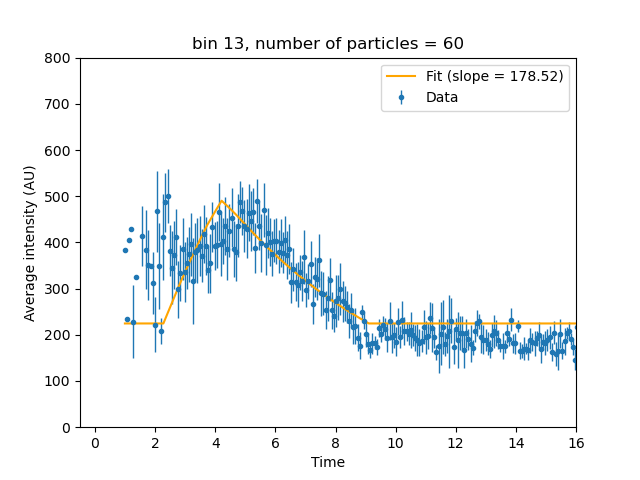

Fitted parameters:
basal: 194.65556957459182, t_on: 0.0034323300446136434, t_dwell: 5.68918549812339, t_active: -0.06334758018552644, tau: 1.6197382921981591, rate: 78.9945175186425
Residual norm: 1341.855413033521
basal: [-645.3994399  1034.71057905]
t_on: [-3.83548033e+08  3.83548033e+08]
t_dwell: [-5.58134409e+08  5.58134421e+08]
t_active: [-2.59165881e+08  2.59165881e+08]
tau: [-292.12801445  295.36749104]
rate: [-387.98060984  545.96964488]


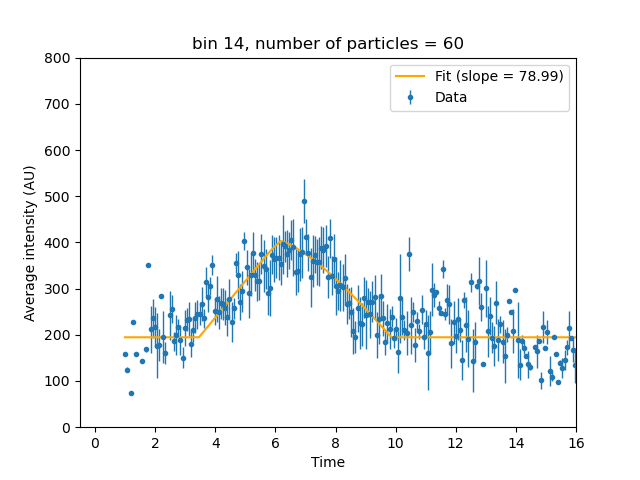

In [141]:
slopes_YJK = []
for bin in range(bin_num):
    try:
        rate = PlotTrace(intensity_by_frame, bin)
        slopes_YJK.append(rate)
    except:
        slopes_YJK.append(np.nan)

In [142]:
slopes_YJK[2] = np.nan
slopes_YJK[::-1]

[nan,
 nan,
 78.9945175186425,
 178.52241427475937,
 155.82844244783954,
 169.9009822401484,
 193.57771207487835,
 157.6402435958008,
 190.0421700825392,
 136.35633854322592,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan]

## Plots of Slopes vs. AP Bin

Text(13, -30, 'A')

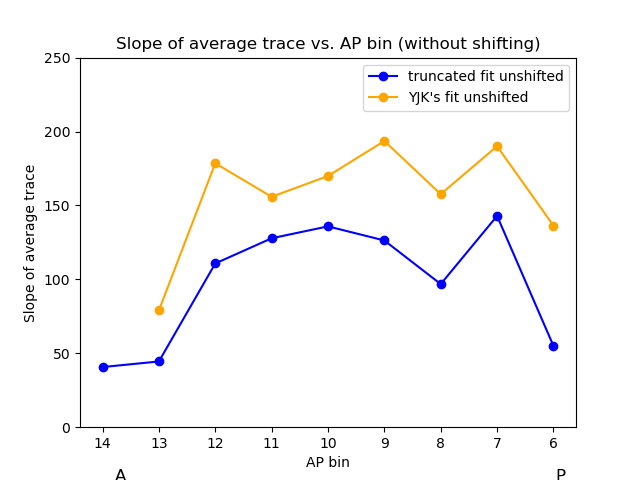

In [163]:
start_bin = 5
end_bin = 14
slope_for_plot = slopes_unshifted[start_bin:end_bin]

plt.figure()
plt.plot(np.array(range(start_bin, end_bin))+1, slope_for_plot, '-o', label='truncated fit unshifted', color='blue')
plt.plot(range(len(slopes_YJK)), slopes_YJK, '-o', label="YJK's fit unshifted", color='orange')
plt.xlabel('AP bin')
plt.ylabel('Slope of average trace')
plt.ylim(0,250)
plt.title('Slope of average trace vs. AP bin (without shifting)')
plt.legend()
plt.gca().invert_xaxis()

# Adding "P" on the left end of the x-axis
plt.annotate('P', xy=(start_bin+1, 0), xycoords='data', xytext=(start_bin, -30),
             textcoords='offset points', ha='center', va='top', fontsize=12)

# Adding "A" on the right end of the x-axis
plt.annotate('A', xy=(end_bin, 0), xycoords='data', xytext=(end_bin-1, -30),
             textcoords='offset points', ha='center', va='top', fontsize=12)

Text(13, -30, 'A')

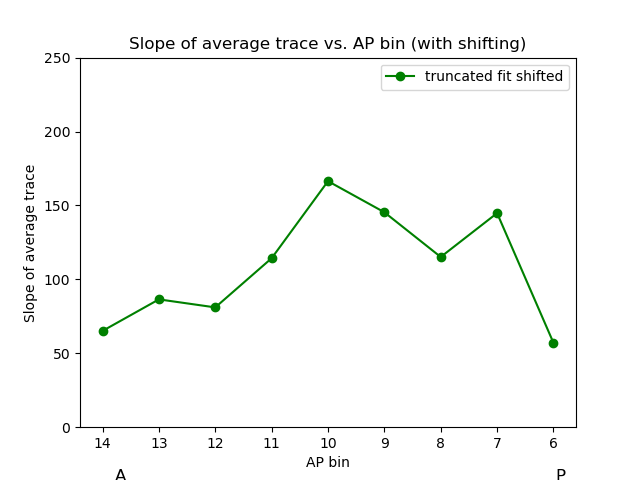

In [164]:
start_bin = 5
end_bin = 14
slope_for_plot = slopes_shifted[start_bin:end_bin]

plt.figure()
plt.plot(np.array(range(start_bin, end_bin))+1, slope_for_plot, '-o', label='truncated fit shifted', color='green')
#plt.plot(range(len(slopes_YJK)), slopes_YJK, '-o', label="YJK's fit", color='orange')
plt.xlabel('AP bin')
plt.ylabel('Slope of average trace')
plt.ylim(0,250)
plt.title('Slope of average trace vs. AP bin (with shifting)')
plt.legend()
plt.gca().invert_xaxis()

# Adding "P" on the left end of the x-axis
plt.annotate('P', xy=(start_bin+1, 0), xycoords='data', xytext=(start_bin, -30),
             textcoords='offset points', ha='center', va='top', fontsize=12)

# Adding "A" on the right end of the x-axis
plt.annotate('A', xy=(end_bin, 0), xycoords='data', xytext=(end_bin-1, -30),
             textcoords='offset points', ha='center', va='top', fontsize=12)

Text(13, -30, 'A')

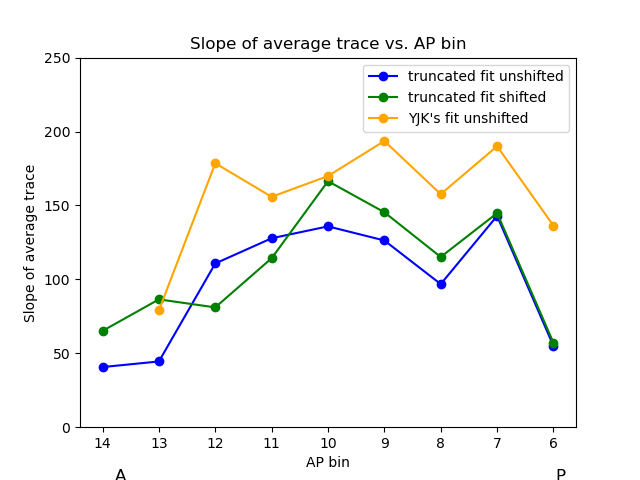

In [166]:
start_bin = 5
end_bin = 14

plt.figure()
plt.plot(np.array(range(start_bin, end_bin))+1, slopes_unshifted[start_bin:end_bin], '-o', label='truncated fit unshifted', color='blue')
plt.plot(np.array(range(start_bin, end_bin))+1, slopes_shifted[start_bin:end_bin], '-o', label='truncated fit shifted', color='green')
plt.plot(range(len(slopes_YJK)), slopes_YJK, '-o', label="YJK's fit unshifted", color='orange')
plt.xlabel('AP bin')
plt.ylabel('Slope of average trace')
plt.ylim(0,250)
plt.title('Slope of average trace vs. AP bin')
plt.legend()
plt.gca().invert_xaxis()

# Adding "P" on the left end of the x-axis
plt.annotate('P', xy=(start_bin+1, 0), xycoords='data', xytext=(start_bin, -30),
             textcoords='offset points', ha='center', va='top', fontsize=12)

# Adding "A" on the right end of the x-axis
plt.annotate('A', xy=(end_bin, 0), xycoords='data', xytext=(end_bin-1, -30),
             textcoords='offset points', ha='center', va='top', fontsize=12)

## Test of Linear Fit in 

In [399]:
# a function that generates a linear fit to the specified range of the plot

def linear_fit_in_range(x, y, x_range=[min(x),max(x)]):
    # Convert lists to numpy arrays
    x_data = np.array(list(x))
    y_data = np.array(list(y))
    
    # Mask to select data within the specified x range
    mask = (x_data >= x_range[0]) & (x_data <= x_range[1])
    x_selected = x_data[mask]
    y_selected = y_data[mask]
    
    # Perform linear fit
    fit_params = np.polyfit(x_selected, y_selected, 1)
    slope, intercept = fit_params
    
    return slope, intercept, x_selected

133.54663065491079


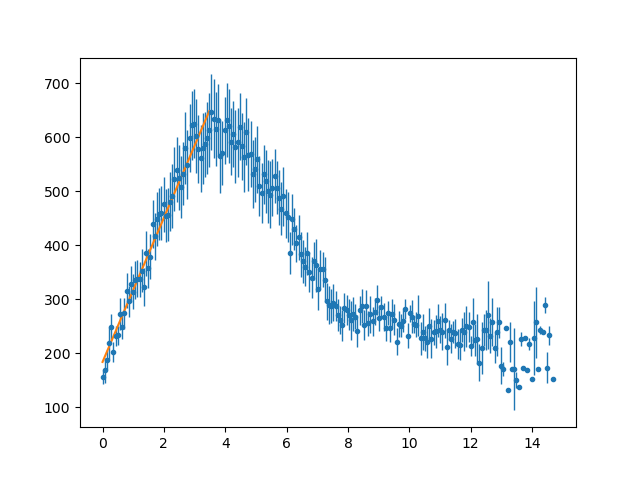

In [401]:
bin = 8
time_res_min = 4.25939/60
x = np.array(intensity_by_frame[bin]['frame'])*time_res_min
y = np.array(intensity_by_frame[bin]['average_intensity'])
y_err = np.array(intensity_by_frame[bin]['std_err_intensity'])

plt.figure()
plt.errorbar(x, y, yerr=y_err, fmt=".", elinewidth=1,)
k, b, x_lim = linear_fit_in_range(x, y, x_range=[0, 3.5])
plt.plot(x_lim, k*x_lim+b)
print(k)